# 1. Цель работы

Разработать автоматизированное *универсальное* решение для распознавания номеров припаркованных автомобилей.

Необходимо разработать модуль определения номеров автомобилей по фото. Каждое входное изображение должно распознаваться по одному и тому же алгоритму без изменений параметров методов.

## Utils

In [1]:
import cv2
import skimage
import numpy as np
import matplotlib.pyplot as plt

import random
import subprocess

from abc import ABC
from typing import Literal

In [2]:
SOURCES_DIR_PATH = 'sources/'

In [3]:
def show_pic(img, ax=plt, title='', is_bgr=True, **kwargs):
    '''Function for showing one or more pictures'''
    if kwargs.get('cmap') or is_bgr is False:
        ax.imshow(img, **kwargs)
    else:
        ax.imshow(img[..., ::-1], **kwargs)
    ax.axis('off')

    try:
        ax.set_title(title)
    except: ax.title(title)

# 2. Загрузка изображений

## Get photos

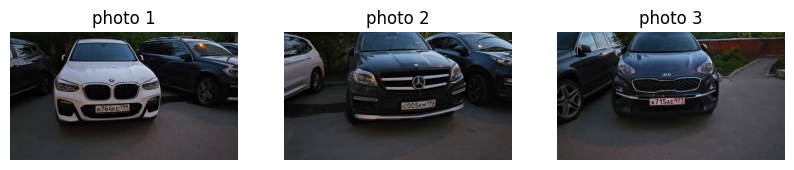

In [4]:
# Get photos

img1 = cv2.imread(SOURCES_DIR_PATH + 'car1.jpg')
img2 = cv2.imread(SOURCES_DIR_PATH + 'car2.jpg')
img3 = cv2.imread(SOURCES_DIR_PATH + 'car3.jpg')

_, ax = plt.subplots(1, 3, figsize=(10, 10))

show_pic(img1, ax[0], title='photo 1')
show_pic(img2, ax[1], title='photo 2')
show_pic(img3, ax[2], title='photo 3')

## Get video

In [5]:
def get_i_frame_type_idxs(filename):
    '''Get frames which have big changes'''

    cmd = f'ffprobe -show_entries frame=pict_type -of default=noprint_wrappers=1 {filename}'

    out = subprocess.check_output(cmd.split()).decode()
    i_frame_types_idx = [i for i, frame_type in enumerate(out.split()) if frame_type in 'pict_type=I']

    return i_frame_types_idx

In [6]:
def show_target_frames(target_frames, columns_count=3):
    '''Show frames from list'''

    _, ax = plt.subplots(
        int((len(target_frames) / columns_count) + ((len(target_frames) % columns_count) != 0)),
        columns_count,
        figsize=(8, 3)
    )
    i, j = 0, 0

    for n, frame in enumerate(target_frames, 1):
        show_pic(frame, ax[j][i], title=f'frame {n}')
        if i+1 == columns_count:
            i = 0
            j += 1
        else:
            i += 1

In [415]:
def show_big_changed_frames(filename, threshold=0.80):
    '''Define and show main frames of video'''
    # 1. Get big changed frames indexes
    i_frames_idxs = get_i_frame_type_idxs(filename)

    # 2. Get video capture object
    cap = cv2.VideoCapture(filename)

    # 3. Get first frame
    cap.set(cv2.CAP_PROP_POS_FRAMES, i_frames_idxs[0])
    _, frame = cap.read()
    print_frames = [frame,]

    for frame1, frame2 in zip(i_frames_idxs[:-1], i_frames_idxs[1:]):
        # 4. Save frame for printing if diff more then threshold
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame1)
        _, frame1 = cap.read()

        cap.set(cv2.CAP_PROP_POS_FRAMES, frame2)
        _, frame2 = cap.read()

        diff_sum_by_channles = cv2.sumElems(cv2.absdiff(frame1, frame2))
        total_diff = sum(diff_sum_by_channles[:3]) / 100_000_000

        if total_diff >= threshold:
            print_frames.append(frame2)

    # 5. Show target frames
    show_target_frames(print_frames)

    return print_frames

Python(35094) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
ffprobe version 7.1.1 Copyright (c) 2007-2025 the FFmpeg developers
  built with Apple clang version 16.0.0 (clang-1600.0.26.6)
  configuration: --prefix=/usr/local/Cellar/ffmpeg/7.1.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags='-Wl,-ld_classic' --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libaribb24 --enable-libbluray --enable-libdav1d --enable-libharfbuzz --enable-libjxl --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-lib

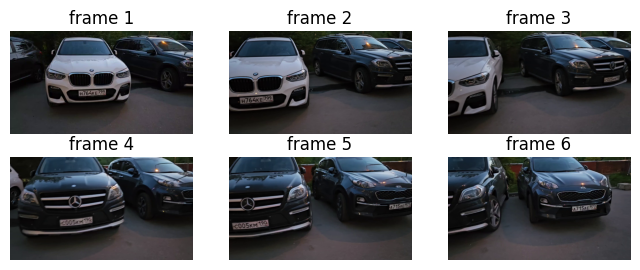

In [416]:
print_frames = show_big_changed_frames(SOURCES_DIR_PATH + 'cam1.mp4')

# 3. Аугментация изображений

## Define augmentations

In [9]:
BORDER_MODE = {
    'default': cv2.BORDER_CONSTANT,
    'copy': cv2.BORDER_REPLICATE,
    'mirror': cv2.BORDER_REFLECT,
    'repead': cv2.BORDER_WRAP
}

In [10]:
def noise(
    img,
    mode: Literal['gaussian', 'poisson', 'salt', 'pepper', 's&p'],
    amount: float = None
):
    if amount:
        try:
            new_img = skimage.util.random_noise(img, mode=mode, amount=amount)
        except:
            try:
                new_img = skimage.util.random_noise(img, mode=mode, var=amount)
            except:
                new_img = skimage.util.random_noise(img, mode=mode)
    else:
        new_img = skimage.util.random_noise(img, mode=mode)

    new_img = (new_img * 255).astype('uint8')

    return new_img


class ColorChanges:
    @classmethod
    def change_hue(cls, img, delta):
        """
        Изменение оттенка: изменяется добавлением к оригинальному оттенку
        любого числа delta в интервале от 0 до 180. Потом берется от 
        результата остаток от деления на 180, чтобы получить новый оттенокю
        """
        hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
        # Индекс оттенка - 0
        h = hsv[:, :, 0]

        h_new = (h+delta) % 180

        hsv[:, :, 0] = h_new

        new_img = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
        return new_img

    @classmethod
    def change_saturation(cls, img, factor):
        """
        Изменение насыщенности: изменяется умножением на положительный фактор.
        Фактор от 0 до 1 уменьшает насыщенность, фактор больше 1 увеличивает
        насыщенность. Значение этого канала должно лежать в интервале от 0 до 255
        """
        # Индекс насыщенности - 1
        hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

        # Выделение канала s - насыщенности с указанием, что число может быть больше 255 (float32)
        # чтобы умножение на большой фактор не приводило к переполнению переменной s
        s = hsv[:, :, 1].astype('float64')

        # обрезаем полученное число насыщенности методом np.clip,
        # чтобы оно гарантированно осталось в интервале от 0 до 255
        s_new = np.clip(s*factor, 0, 255)

        # число возвращается из float32 в uint8
        hsv[:, :, 1] = s_new.astype('uint8')

        new_img = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)

        return new_img

    @classmethod
    def change_brightness(cls, img, factor):
        """
        Изменение яркости: может изменяться как умножением на фактор,
        так и добавлением некоторой дельты. Значение этого канала
        должно лежать в интервале от 0 до 255.
        """
        # Индекс яркости - 2
        hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
        v = hsv[:, :, 2].astype('float64')

        v_new = np.clip(v * factor, 0, 255)

        hsv[:, :, 2] = v_new.astype('uint8')

        new_img = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)

        return new_img

    @classmethod
    def change_contrast(cls, img, factor):
        """
        Изменение контрастности: усиливает разницу между наиболее 
        тёмными и наиболее светлыми пикселями. Граница между светлыми
        и тёмными пикселями проходит по значению 127,5 — это среднее
        между 0 и 255
        """
        # вычесть из всех пикселей изображения среднее 127,5,
        # тогда все светлые пиксели останутся положительными
        # числами, а тёмные станут отрицательными.
        new_img = img - 127.5

        # если фактор больше 1, разница между положительными и
        # отрицательными числами увеличится, если фактор от
        # 0 до 1 — уменьшится.
        new_img *= factor

        # Добавить к числам среднее, чтобы снова превратить
        # числа в значения пикселей и убедиться, что все пиксели
        # лежат в интервале от 0 до 255 с помощью функции np.clip
        new_img = np.clip(new_img + 127.5, 0, 255).astype('uint8')

        return new_img

    @classmethod
    def change_gamma(cls, img, gamma):
        """
        Изменение гаммы: нелинейное преобразование яркости каждого пикселя.
        Пиксели переводятся из интервала от 0 до 255 к интервалу от 0 до 1,
        то есть делятся на 255. После изменения — умножаются обратно.
        С параметром от 0 до 1 изображение будет выглядеть темнее оригинала,
        с параметром больше 1 — светлее:

        newPix = ( oldPx / 255) ^ (1/gamma) * 255
        """

        inv_gamma = 1.0 / gamma

        # создаем таблицу, где каждому значению пикселя от 0 до 255
        # приводится в соответствие новое значение пикселя, рассчитанное
        # по формуле с учётом параметра гамма
        table = np.array([
            ((i / 255.0) ** inv_gamma) * 255 for i in np.arange(0, 256)
        ]).astype('uint8')

        # переводим прежние значения пикселей в новые по таблице с
        # помощью функции cv2.LUT (look-up table)
        new_img = cv2.LUT(img, table)

        return new_img


class GeometricChanges:
    @classmethod
    def flip(cls, img, mode: Literal['h', 'v']):
        """
        отражение, два режима: 
            'h': горизонтальный
            'v': вертикальный
        """
        if mode == 'h':
            new_img = img[:, ::-1]
        else:
            new_img = img[::-1]

        return new_img

    @classmethod
    def crop(
        cls, img, x, y, h, w, mode: Literal['trim', 'cut']
    ):
        """ 
        вырезать:
            mode:
                'trim': обрезать
                'cut': вырезать
            x and y: начальная кардината вырезаемого куска
            h and w: размер вырезаемого куска
        """

        x, y, h, w = int(x), int(y), int(h), int(w)

        if mode == 'trim':
            croped_img = img[y:y+h, x:x+w]

            new_img = np.zeros(img.shape, dtype='uint8')
            new_img[y:y+h, x:x+w] = croped_img
        else:
            new_img = img.copy()
            new_img[y:y+h, x:x+w] = 0

        return new_img

    @classmethod
    def zoom_in(cls, img, factor):
        """ 
        приближение: фактор должен быть больше 1
        """
        img_h, img_w = img.shape[:2]

        # Расчёт матрицы преобразования изображения
        # Для этого указан центр (что именно приближать)
        # Угол поворота - 0, так как поворот не нужен
        # Масштаб - фактор
        m_zoom = cv2.getRotationMatrix2D(
            center=(img_h / 2, img_w / 2),
            angle=0,
            scale=factor
        )

        # Приближение изображения и размещение в тензоре
        # размера изначального изображения с помощью
        # аффинного преобразования
        new_img = cv2.warpAffine(
            img, M=m_zoom, dsize=(img_w, img_h)
        )

        return new_img

    @classmethod
    def rotate(
        cls,
        img,
        angle,
        mode: Literal['default', 'copy', 'mirror', 'repead'] = 'default'
    ):
        """ 
        поворот
        """
        img_h, img_w = img.shape[:2]

        m_rotate = cv2.getRotationMatrix2D(
            center=(img_h / 2, img_w / 2),
            angle=angle,
            scale=1
        )

        new_img = cv2.warpAffine(
            img,
            M=m_rotate,
            dsize=(img_w, img_h),
            borderMode=BORDER_MODE[mode]
        )

        return new_img


    @classmethod
    def change_perspective(
        cls,
        img,
        perspective_points,
        mode: Literal['default', 'copy', 'mirror', 'repead'] = 'default'
    ):
        """
        изменение перспективы: 4 точки должны лежать в пределах изображения

        perspective_points[0]: top-left: куда переместить левый верхний угол
        perspective_points[1]: top-right: куда переместить правый верхний угол
        perspective_points[2]: bottom-left: куда переместить левый нижний угол
        perspective_points[3]: bottom-right: куда переместить правый нижний угол
        
        x->
          -------------------------------------
          | top-left               top-right
          |
        ^ |
        | | bottom-left            bottom-right
        y |
        
        """
        img_height, img_width = img.shape[:2]

        # Выбор точек, которые задают новую перспективу, т.е. границ изображения
        new_perspective_points = np.float32(
            [[0, 0], [img_width, 0], [0, img_height], [img_width, img_height]])

        # Расчёт матрицы перехода от одной перспективы к другой
        m_prerspective = cv2.getPerspectiveTransform(
            perspective_points, new_perspective_points
        )

        # Применение преобразования перспективы
        new_img = cv2.warpPerspective(
            img,
            M=m_prerspective,
            dsize=(img_width, img_height),
            borderMode=BORDER_MODE[mode]
        )
        return new_img

In [11]:
class RandomChanges(ABC):
    def __init__(self): ...

    def __call__(self, img):
        new_img = img

        # Get method from all in change_args_mapping randomly
        method = random.choice(list(self.change_args_mapping.keys()))

        # Get all arguments to it
        args = {}

        for arg, d in self.change_args_mapping[method].items():
            if isinstance(d, list):
                arg_val = random.choice(d)
            else:
                arg_val = np.random.uniform(d[0], d[1])
                if isinstance(d[0], int):
                    arg_val = int(arg_val)

            args[arg] = arg_val

        # Calculate new picture
        print(f'\t- For {method.__name__}: {args}')
        new_img = method(img, **args)

        return new_img

In [12]:
class RandomColorChanges(RandomChanges):
    def __init__(
        self,
        d_delta = (1, 15),
        d_saturation_factor = (0.5, 1),
        d_brightness_factor = (0.5, 1),
        d_contrast_factor=(0.5, 1),
        d_gamma = (0.5, 1)
    ):
        super().__init__()
        self.change_args_mapping = {
            ColorChanges.change_hue: {'delta': d_delta},
            ColorChanges.change_saturation: {'factor': d_saturation_factor},
            ColorChanges.change_brightness: {'factor': d_brightness_factor},
            ColorChanges.change_contrast: {'factor': d_contrast_factor},
            ColorChanges.change_gamma: {'gamma': d_gamma}
        }

    def __str__(self):
        return 'ColorChanges'


class RandomNoiseChanges(RandomChanges):
    def __init__(self):
        super().__init__()

        self.change_args_mapping = {
            noise: {
                'mode': ['poisson', 's&p'],#, 'gaussian', ],
                'amount': (0.01, 0.02)
            }
        }

    def __str__(self):
        return 'RandomNoiseChanges'


class RandomRotateChanges(RandomChanges):
    def __init__(self, d_angle=(2,4)):
        super().__init__()

        self.change_args_mapping = {
            GeometricChanges.rotate: {'angle': d_angle}
        }

    def __str__(self):
        return 'RandomRotateChanges'


class RandomCutChanges(RandomChanges):
    def __init__(
        self,
        d_x=(1, 25),
        d_y=(1, 25),
        d_h=(1, 10),
        d_w=(1, 10)
    ):
        super().__init__()

        self.change_args_mapping = {
            GeometricChanges.crop: {
                'x': d_x,
                'y': d_y,
                'h': d_h,
                'w': d_w,
                'mode': ['cut']
            }
        }

    def __str__(self):
        return 'RandomCutChanges'


class RandomZoomInChanges(RandomChanges):
    def __init__(self, d_factor=(1.0, 1.5)):
        super().__init__()

        self.change_args_mapping = {
            GeometricChanges.zoom_in: {'factor': d_factor}
        }

    def __str__(self):
        return 'RandomZoomInChanges'

## Create augmentation images

In [13]:
def get_augmentation_image(img, img_name='img'):
    augmentation_steps = random.sample([
        RandomColorChanges(),
        RandomNoiseChanges(),
        RandomRotateChanges(),
        RandomCutChanges(),
        RandomZoomInChanges()
    ], 2)

    print(f'Changes for {img_name}: {augmentation_steps[0].__str__()}, {augmentation_steps[1].__str__()}')

    aug_img = img.copy()

    for transform in augmentation_steps:
        aug_img = transform(aug_img)

    return aug_img

Создадим три различных аугментации для каждого из изображений для проверки на разных кейсах

Changes for aug1_img1: RandomCutChanges, RandomZoomInChanges
	- For crop: {'x': 23, 'y': 5, 'h': 8, 'w': 5, 'mode': 'cut'}
	- For zoom_in: {'factor': 1.223871653247034}
Changes for aug1_img2: RandomRotateChanges, ColorChanges
	- For rotate: {'angle': 2}
	- For change_gamma: {'gamma': 0.8583700796480116}
Changes for aug1_img3: RandomNoiseChanges, RandomZoomInChanges
	- For noise: {'mode': 'poisson', 'amount': 0.01719709086589691}
	- For zoom_in: {'factor': 1.3857845630152417}


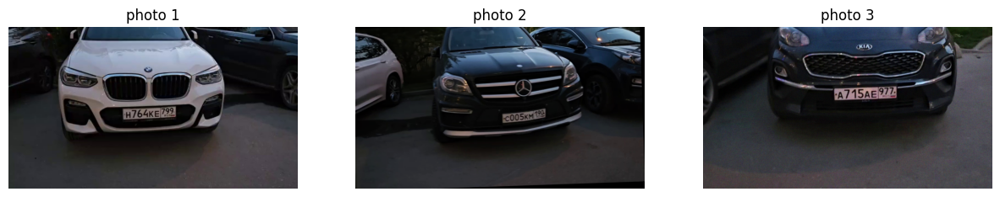

In [159]:
aug1_img1 = get_augmentation_image(img1, 'aug1_img1')
aug1_img2 = get_augmentation_image(img2, 'aug1_img2')
aug1_img3 = get_augmentation_image(img3, 'aug1_img3')


_, ax = plt.subplots(1, 3, figsize=(15, 7))

show_pic(aug1_img1, ax[0], title='photo 1')
show_pic(aug1_img2, ax[1], title='photo 2')
show_pic(aug1_img3, ax[2], title='photo 3')

Changes for aug2_img1: RandomCutChanges, ColorChanges
	- For crop: {'x': 11, 'y': 9, 'h': 7, 'w': 4, 'mode': 'cut'}
	- For change_saturation: {'factor': 0.7449952756467447}
Changes for aug2_img2: ColorChanges, RandomCutChanges
	- For change_hue: {'delta': 9}
	- For crop: {'x': 4, 'y': 1, 'h': 8, 'w': 4, 'mode': 'cut'}
Changes for aug2_img3: RandomRotateChanges, RandomNoiseChanges
	- For rotate: {'angle': 3}
	- For noise: {'mode': 'poisson', 'amount': 0.011861862944343625}


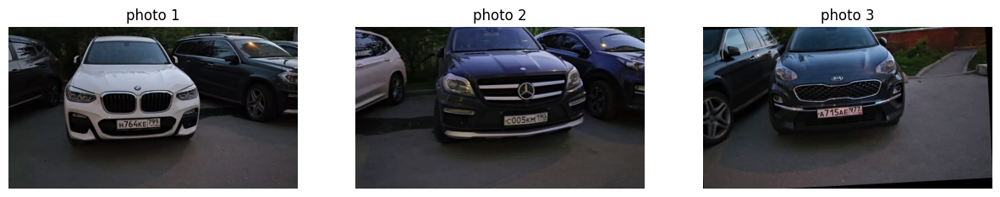

In [187]:
aug2_img1 = get_augmentation_image(img1, 'aug2_img1')
aug2_img2 = get_augmentation_image(img2, 'aug2_img2')
aug2_img3 = get_augmentation_image(img3, 'aug2_img3')


_, ax = plt.subplots(1, 3, figsize=(15, 7))

show_pic(aug2_img1, ax[0], title='photo 1')
show_pic(aug2_img2, ax[1], title='photo 2')
show_pic(aug2_img3, ax[2], title='photo 3')

Changes for aug3_img1: RandomCutChanges, ColorChanges
	- For crop: {'x': 5, 'y': 24, 'h': 7, 'w': 2, 'mode': 'cut'}
	- For change_contrast: {'factor': 0.5396069335118061}
Changes for aug3_img2: ColorChanges, RandomNoiseChanges
	- For change_brightness: {'factor': 0.8322019627791319}
	- For noise: {'mode': 'poisson', 'amount': 0.01238012864385596}
Changes for aug3_img3: RandomNoiseChanges, ColorChanges
	- For noise: {'mode': 'poisson', 'amount': 0.012687294460923124}
	- For change_gamma: {'gamma': 0.8879175015293882}


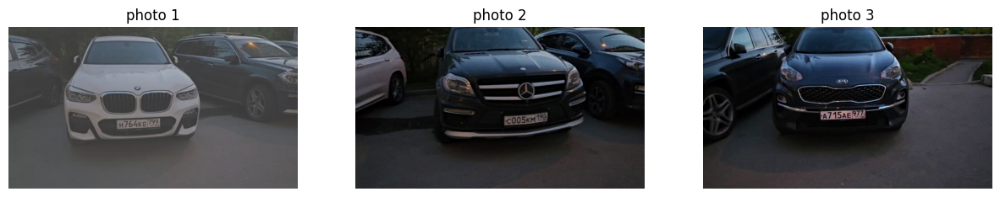

In [188]:
aug3_img1 = get_augmentation_image(img1, 'aug3_img1')
aug3_img2 = get_augmentation_image(img2, 'aug3_img2')
aug3_img3 = get_augmentation_image(img3, 'aug3_img3')


_, ax = plt.subplots(1, 3, figsize=(15, 7))

show_pic(aug3_img1, ax[0], title='photo 1')
show_pic(aug3_img2, ax[1], title='photo 2')
show_pic(aug3_img3, ax[2], title='photo 3')

# 4. Предобработка изображений

In [162]:
def preprocess(img):
    # 1. Convert to gray
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # 2. Blure image
    img_blured = cv2.medianBlur(img_gray, 7)

    # 3. Detect vertical lines
    img_detect_vertical_lines = np.uint8(np.abs(cv2.Sobel(
        img_blured, cv2.CV_64F, 1, 0, ksize=1
    )))

    # 4. Img binarization
    threshold, binary_img = cv2.threshold(
        img_detect_vertical_lines, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU
    )
    print('Threshold OTSU:', threshold)

    # 5. Morpgology operations: 
    #   - close small black hols in white objects
    rect_kernel = cv2.getStructuringElement(
        shape=cv2.MORPH_RECT, ksize=(40, 15)
    )
    img_closing = cv2.morphologyEx(
        src=binary_img, op=cv2.MORPH_CLOSE, kernel=rect_kernel
    )

    #   - erode for get white pixel just for object
    kernel = cv2.getStructuringElement(
        shape=cv2.MORPH_RECT, ksize=(4, 8)
    )
    img_sure_obj = cv2.erode(img_closing, kernel)

    # 6. Detect edges
    img_edges = cv2.Canny(
        img_sure_obj, 50, 200, apertureSize=3, L2gradient=True
    )

    fg, ax = plt.subplots(2, 3, figsize=(20, 9))

    show_pic(img_blured, ax[0][0], title='Blured', cmap='gray')
    show_pic(img_detect_vertical_lines, ax[0][1], title='Sobel vertical lines', cmap='gray')
    show_pic(binary_img, ax[0][2], title='Binary', cmap='gray')
    show_pic(img_closing, ax[1][0], title='Closed', cmap='gray')
    show_pic(img_sure_obj, ax[1][1], title='Erode sure object', cmap='gray')
    show_pic(img_edges, ax[1][2], title='Edges detected', cmap='gray')

    return img_edges

Предобработаем каждое изображения и выделим границы для дальнейшего вычленения номера

Threshold OTSU: 20.0
Threshold OTSU: 13.0
Threshold OTSU: 19.0


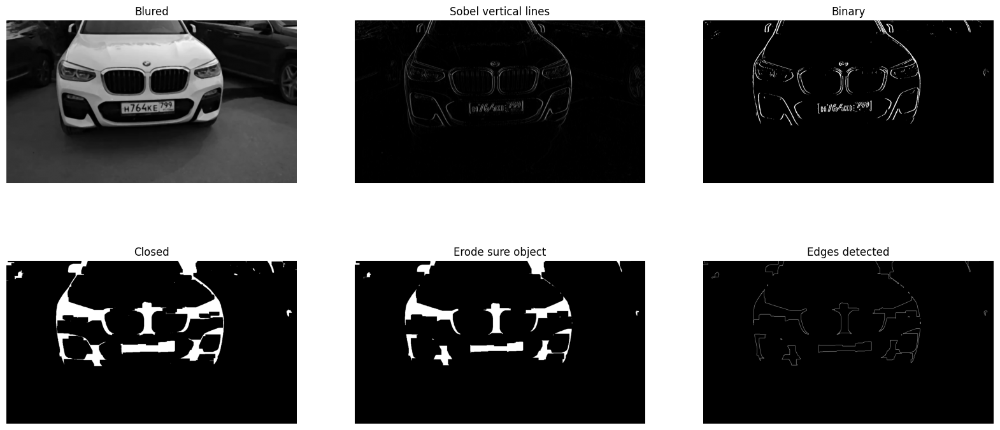

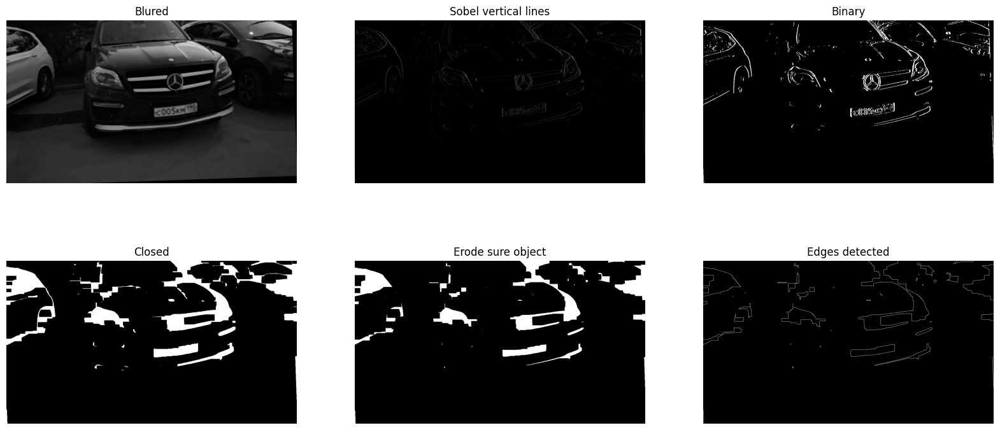

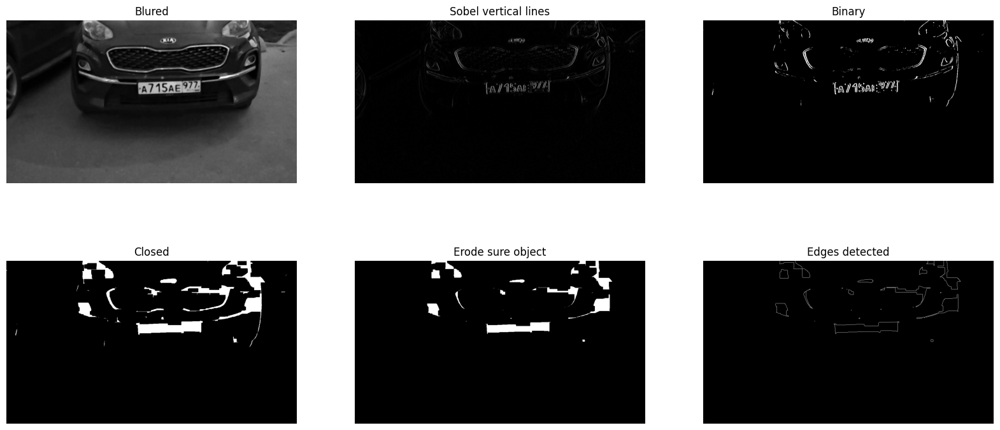

In [163]:
preprocess_img11 = preprocess(aug1_img1)
preprocess_img12 = preprocess(aug1_img2)
preprocess_img13 = preprocess(aug1_img3)

Threshold OTSU: 23.0
Threshold OTSU: 14.0
Threshold OTSU: 19.0


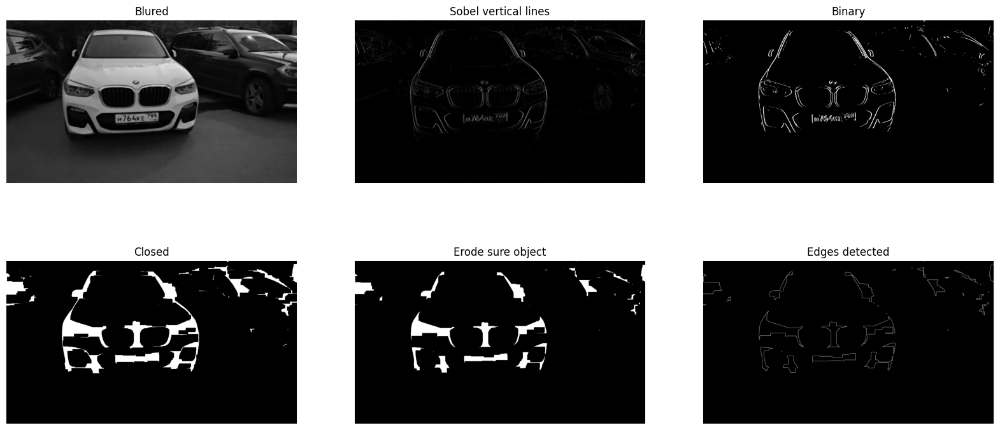

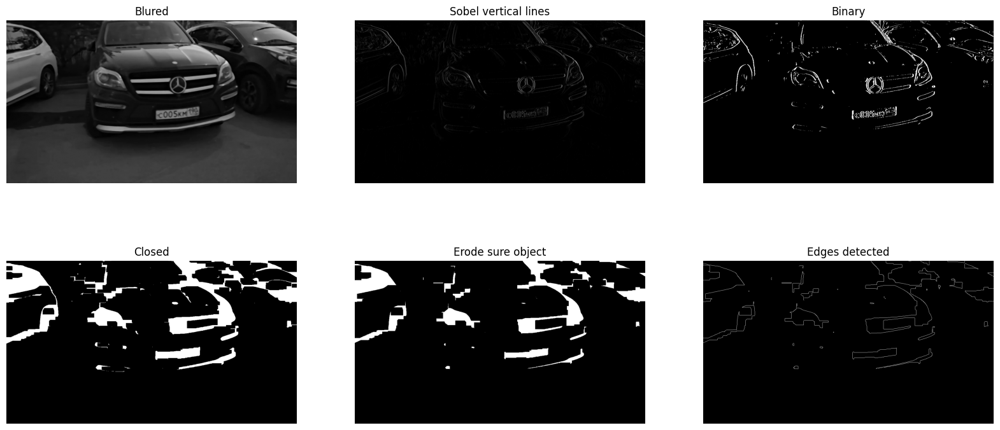

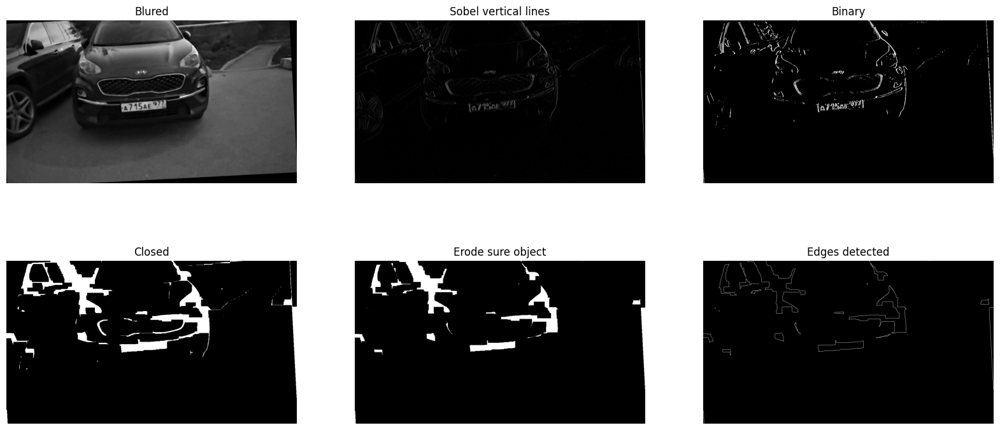

In [189]:
preprocess_img21 = preprocess(aug2_img1)
preprocess_img22 = preprocess(aug2_img2)
preprocess_img23 = preprocess(aug2_img3)

Threshold OTSU: 12.0
Threshold OTSU: 12.0
Threshold OTSU: 19.0


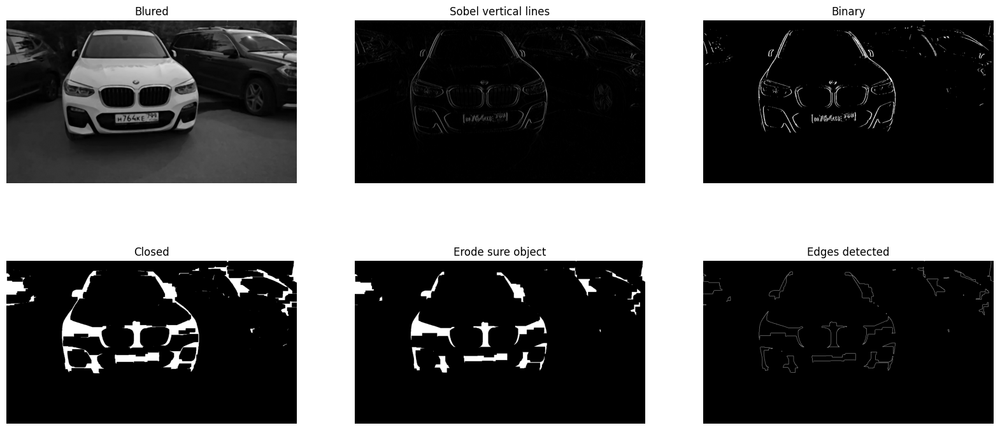

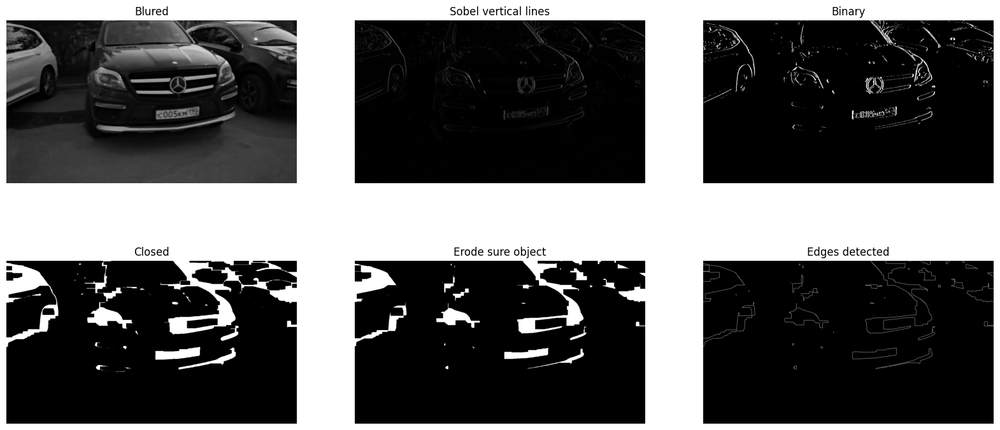

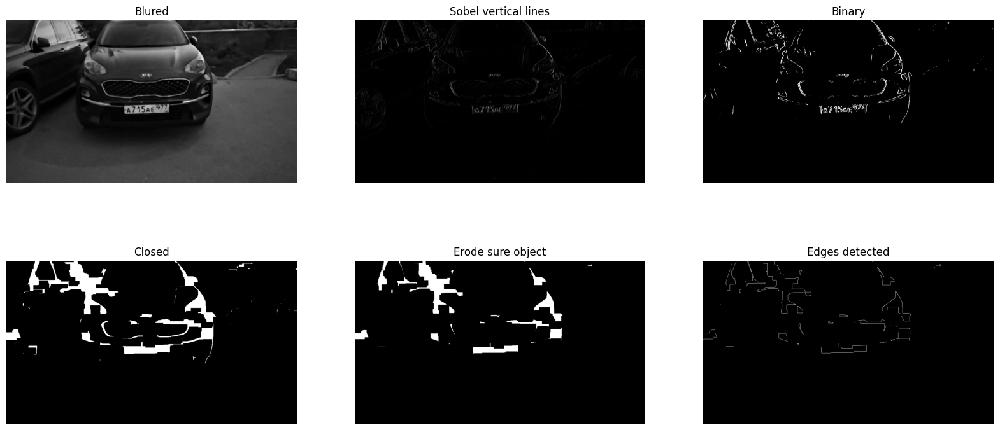

In [190]:
preprocess_img31 = preprocess(aug3_img1)
preprocess_img32 = preprocess(aug3_img2)
preprocess_img33 = preprocess(aug3_img3)

# 5. Поиск области с текстом

In [166]:
def get_approx_coords(coords, epsilon_v=0.02):
    perimeter = cv2.arcLength(coords, closed=True)  # True means closed contour
    epsilon = epsilon_v * perimeter  # Use 2% of perimeter as epsilon
    approx_coord = cv2.approxPolyDP(coords, epsilon, closed=True)
    possible_vertices_count = len(
        cv2.approxPolyDP(coords, epsilon, closed=True)
    )

    return approx_coord, possible_vertices_count


def get_plate(preprocessed_img, img):
    # 1. Get contours
    contours, _ = cv2.findContours(
        preprocessed_img, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE
    )
    img_with_contours = cv2.drawContours(img.copy(), contours, -1, (0, 255, 0), 3)

    # 2. Get approxed contours coords
    approx_coord = [get_approx_coords(cnt) for cnt in contours]

    founded_boxes = []
    img_rects = img.copy()
    img_aprox = img.copy()

    # 3. Let find plate coords
    for cnt_info in approx_coord:
        cnt = cnt_info[0]
        possible_vertices_count = cnt_info[1]

        # 3.1. Get rectangle from approx coords
        x, y, w, h = cv2.boundingRect(cnt)

        # 3.2 Get the coords by area, ratio and check it have closed contour
        if 30_000 > (w * h) > 6_600 and 3.0 < w/h < 5.7 and cv2.contourArea(cnt) > 0:
            cv2.drawContours(img_aprox, [cnt], -1, (0, 255, 0), 3)

            # print(possible_vertices_count, (w / h), (w * h), cv2.contourArea(cnt))

            # 3.3 Filter by count of approx vertices
            if 8 >= possible_vertices_count > 2:
                founded_boxes.append([x, y, x+w, y+h])

    # 4. Delete closed contours
    founded_boxes_without_same = []
    if len(founded_boxes):
        founded_boxes_without_same = [founded_boxes[0]]
        for i in range(len(founded_boxes)-1):
            coord1 = founded_boxes[i]
            coord2 = founded_boxes[i+1]
            is_big_diff = any(
                el > 20 for el in 
                [abs(c2 - c1) for c1, c2 in zip(coord1, coord2)]
            )

            if is_big_diff:
                founded_boxes_without_same.append(founded_boxes[i+1])

        for i, coord_d in enumerate(founded_boxes_without_same):
            x1, y1, x2, y2 = coord_d

            # 5. Increment coordinates for easier detection
            x1 -= 10
            y1 -= 10
            x2 += 10
            y2 += 10
            founded_boxes_without_same[i] = [x1, y1, x2, y2]
            cv2.rectangle(img_rects, (x1, y1), (x2, y2), (0, 0, 255), 2)
    
    print('Finded rects coords:', founded_boxes_without_same)

    # 6. Cut the plates
    plate_box = founded_boxes_without_same[0]
    plate_clear = img[plate_box[1]:plate_box[3], plate_box[0]:plate_box[2]]

    # 7. Show all hightlihted, approx and target plate contours
    fg, ax = plt.subplots(1, 4, figsize=(20, 9))

    show_pic(img_with_contours, ax[0], title='With contours')
    show_pic(img_aprox, ax[1], title='Aprox')
    show_pic(img_rects, ax[2], title='Detected objects')
    show_pic(plate_clear, ax[3], title='Plate')

    return plate_clear

Определим номер на каждом изображении

Finded rects coords: [[499, 348, 752, 417]]
Finded rects coords: [[640, 361, 854, 430]]
Finded rects coords: [[565, 261, 874, 335]]


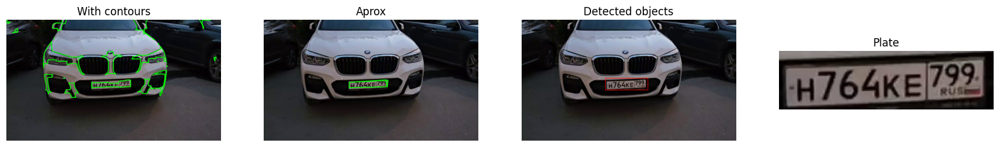

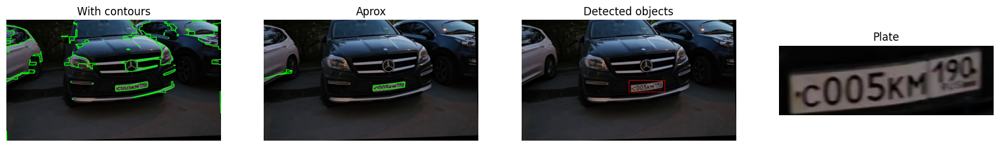

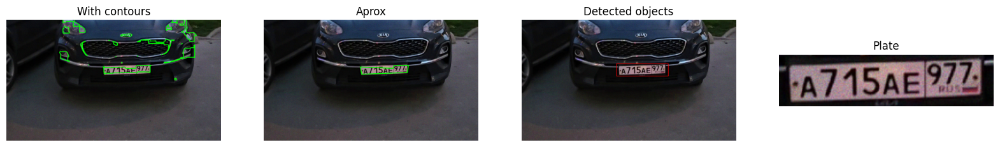

In [167]:
plate11 = get_plate(preprocess_img11, aug1_img1)
plate12 = get_plate(preprocess_img12, aug1_img2)
plate13 = get_plate(preprocess_img13, aug1_img3)

Finded rects coords: [[472, 400, 682, 459]]
Finded rects coords: [[647, 377, 863, 439]]
Finded rects coords: [[496, 345, 718, 414]]


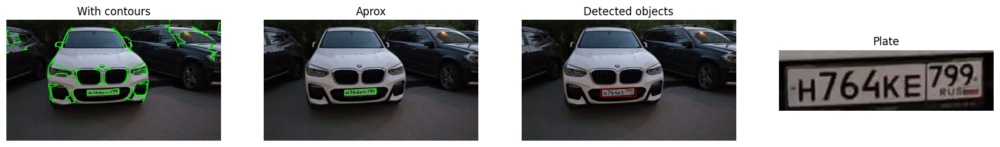

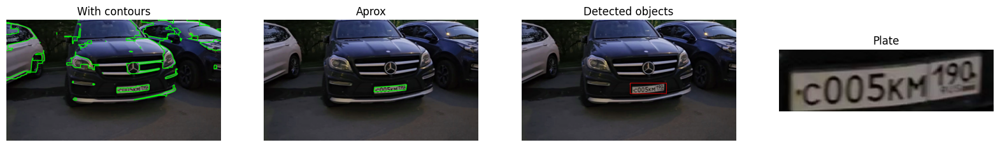

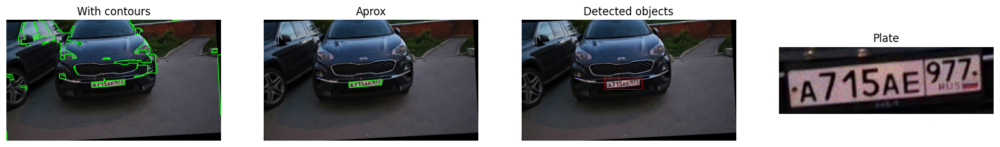

In [191]:
plate21 = get_plate(preprocess_img21, aug2_img1)
plate22 = get_plate(preprocess_img22, aug2_img2)
plate23 = get_plate(preprocess_img23, aug2_img3)

Finded rects coords: [[469, 400, 682, 461]]
Finded rects coords: [[648, 377, 863, 443]]
Finded rects coords: [[509, 355, 731, 421]]


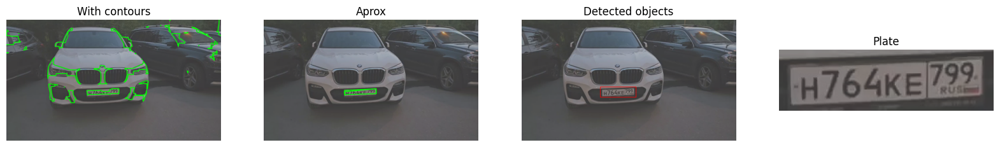

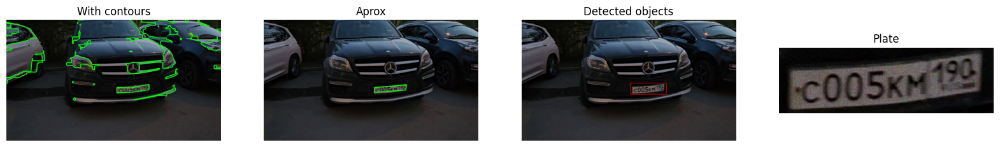

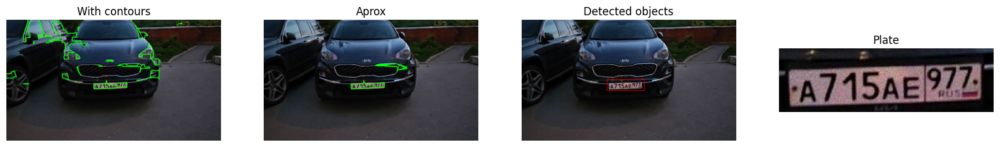

In [192]:
plate31 = get_plate(preprocess_img31, aug3_img1)
plate32 = get_plate(preprocess_img32, aug3_img2)
plate33 = get_plate(preprocess_img33, aug3_img3)

# 6. Предобработка области с текстом.

In [ ]:
def is_inside(inner, outer):
    x_i1, y_i1, x_i2, y_i2 = inner
    x_o1, y_o1, x_o2, y_o2 = outer
    return (x_i1 >= x_o1 and y_i1 >= y_o1 and x_i2 <= x_o2 and y_i2 <= y_o2)


def remove_inner_boxes(boxes):
    '''Detect an remote double boxes for every finded area'''
    checked_idxes = list(range(len(boxes)))

    while len(checked_idxes):
        is_deleted = False
        for i in checked_idxes:
            for j in checked_idxes:
                if i != j and is_inside(boxes[j], boxes[i]):
                    checked_idxes.remove(j)
                    is_deleted = True
                    break
            
            if is_deleted == True:
                break
        else:
            break
    return [boxes[i] for i in checked_idxes]


def get_clean_plate(plate):
    # 1. Clean
    plate_hsv = cv2.cvtColor(plate, cv2.COLOR_BGR2HSV)
    plate_value = plate_hsv[:, :, 2]

    plate_value = cv2.medianBlur(plate_value, 3)
    plate_value = cv2.convertScaleAbs(plate_value, alpha=1.7, beta=0)

    kernel = np.array([[0, -1, 0],
                       [-1, 5, -1],
                       [0, -1, 0]])

    plate_value = cv2.filter2D(plate_value, -1, kernel)

    # 2. Get binary
    threshold, binary_img = cv2.threshold(
        plate_value, 60, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU
    )

    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 1))
    binary_img = cv2.dilate(binary_img, kernel)

    # 3. Get edges
    plate_edges = cv2.Canny(binary_img, 50, 200, apertureSize=3, L2gradient=True)

    # 4. Get contours
    contours, hierarchy = cv2.findContours(
        plate_edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE
    )
    img_with_contours = cv2.drawContours(
        plate.copy(), contours, -1, (0, 255, 0), 1
    )

    finded_contures = [cnt for cnt in contours if cv2.contourArea(cnt) > 1]
    print('Len of finded contures:', len(finded_contures))

    # 5. Approx
    letter_rects = []
    img_aprox = plate.copy()
    letters_img = plate.copy()

    for cnt in finded_contures:
        cnt, c_verts = get_approx_coords(cnt, 0.01)
        x, y, w, h = cv2.boundingRect(cnt)

        cv2.drawContours(img_aprox, [cnt], -1, (0, 255, 0), 1)

        if 1.3 > (w/float(h)) > 0.1 and w*h > 270:
            letter_rects.append([x, y, x+w, y+h])

    # 6. Remote inner boxes
    filtered_contours = remove_inner_boxes(letter_rects)
    for box in filtered_contours:
        x1, y1, x2, y2 = box
        cv2.rectangle(letters_img, (x1, y1), (x2, y2), (0, 255, 0), 1)

    # 7. Display all stage
    fg, ax = plt.subplots(2, 3, figsize=(10, 3))

    show_pic(plate_value, ax[0][0], title='plate_value', cmap='gray')
    show_pic(binary_img, ax[0][1], title='binary_img', cmap='gray')
    show_pic(plate_edges, ax[0][2], title='plate_edges', cmap='gray')
    show_pic(img_with_contours, ax[1][0], title='img_with_contours')
    show_pic(img_aprox, ax[1][1], title='img_aprox', cmap='gray')
    show_pic(letters_img, ax[1][2], title='img_with_contours')

    return plate_value, filtered_contours

Попробуем задетектить каждую букву по отдельности

Len of finded contures: 47
Len of finded contures: 39
Len of finded contures: 54


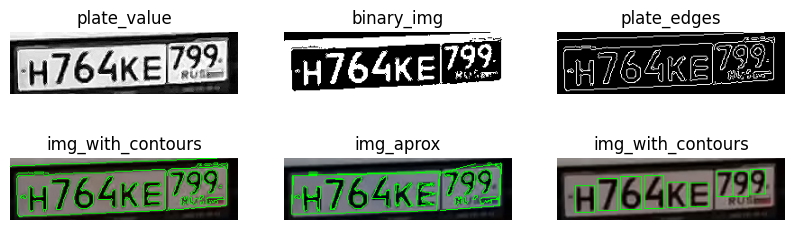

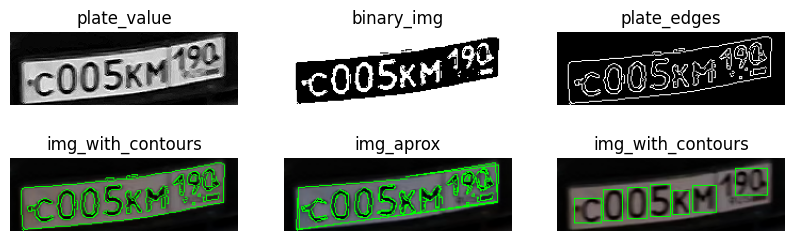

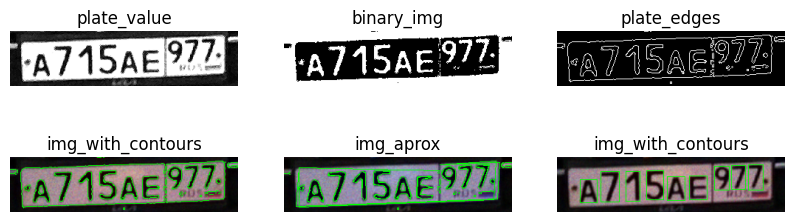

In [ ]:
clean_plate11, filtered_contours11 = get_clean_plate(plate11)
clean_plate12, filtered_contours12 = get_clean_plate(plate12)
clean_plate13, filtered_contours13 = get_clean_plate(plate13)

Len of finded contures: 49
Len of finded contures: 35
Len of finded contures: 54


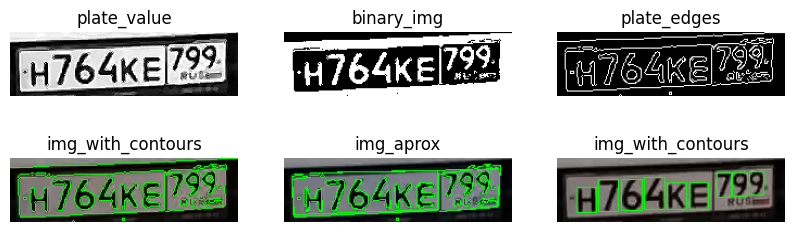

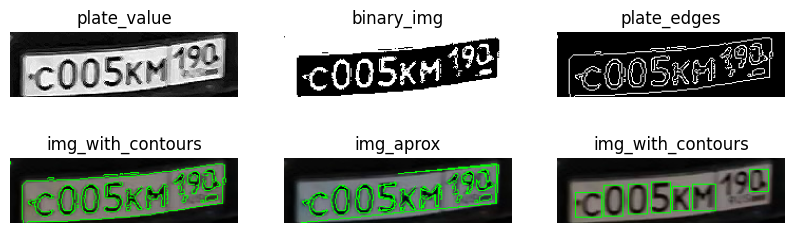

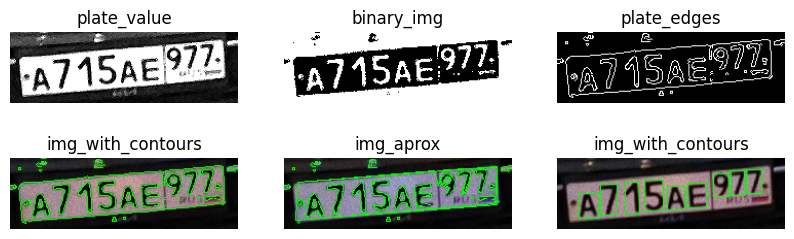

In [ ]:
clean_plate21, filtered_contours21 = get_clean_plate(plate21)
clean_plate22, filtered_contours22 = get_clean_plate(plate22)
clean_plate23, filtered_contours23 = get_clean_plate(plate23)

Len of finded contures: 46
Len of finded contures: 65
Len of finded contures: 47


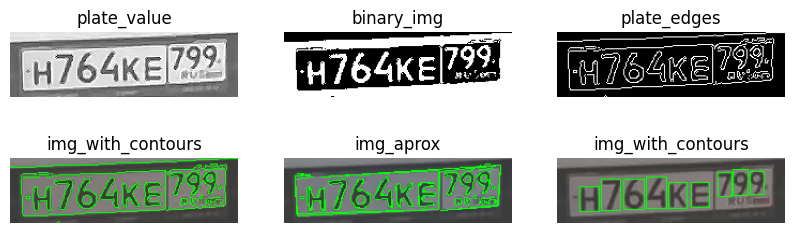

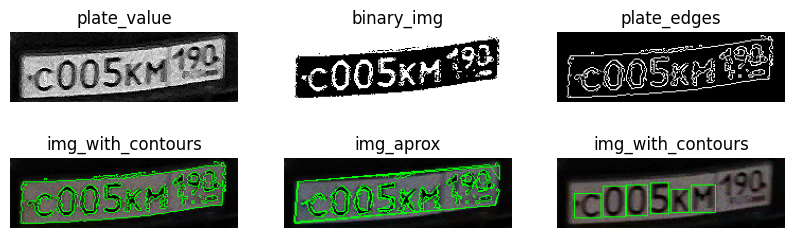

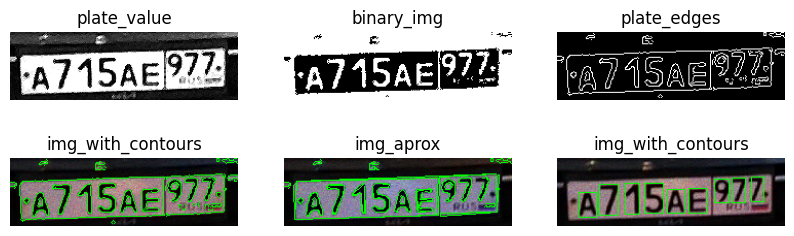

In [ ]:
clean_plate31, filtered_contours31 = get_clean_plate(plate31)
clean_plate32, filtered_contours32 = get_clean_plate(plate32)
clean_plate33, filtered_contours33 = get_clean_plate(plate33)

# 7. Распознавание текста

In [222]:
import pandas as pd
from copy import deepcopy

In [252]:
PICS_MAPS = [
    {
        'name': 'clean_plate11',
        'img': clean_plate11,
        'contours': filtered_contours11,
        'target': 'H764KE799',
    },
    {
        'name': 'clean_plate12',
        'img': clean_plate12,
        'contours': filtered_contours12,
        'target': 'C005KM190',
    },
    {
        'name': 'clean_plate13',
        'img': clean_plate13,
        'contours': filtered_contours13,
        'target': 'A715AE977',
    },
    {
        'name': 'clean_plate21',
        'img': clean_plate21,
        'contours': filtered_contours21,
        'target': 'H764KE799',
    },
    {
        'name': 'clean_plate22',
        'img': clean_plate22,
        'contours': filtered_contours22,
        'target': 'C005KM190',
    },
    {
        'name': 'clean_plate23',
        'img': clean_plate23,
        'contours': filtered_contours23,
        'target': 'A715AE977',
    },
    {
        'name': 'clean_plate31',
        'img': clean_plate31,
        'contours': filtered_contours31,
        'target': 'H764KE799',
    },
    {
        'name': 'clean_plate32',
        'img': clean_plate32,
        'contours': filtered_contours32,
        'target': 'C005KM190',
    },
    {
        'name': 'clean_plate33',
        'img': clean_plate33,
        'contours': filtered_contours33,
        'target': 'A715AE977',
    }
]

RESULTS_PATTERN = {
    'psm': [],
    'oem': [],
    'result': [],
    'target': [],
    'img': [],
    'model': []
}

Попробуем распознать весь номер целиком и сравнить с побуквенным распознаванием. Будем использовать ocs и tesseract

## Easyocr

In [176]:
# ~~~~ UNCOMMETE ME IF THERE SOME PROBLEM WITH SERTEFICATES ~~~~
# import os
# import certifi

# os.environ["SSL_CERT_FILE"] = certifi.where()
# os.environ["REQUESTS_CA_BUNDLE"] = certifi.where()
# ~~~~~~~~~~~~~~~~~~~~~ ~~~~~~~~~~~~~~~~~~~~~ ~~~~~~~~~~~~~~~~~~~

import easyocr

READER = easyocr.Reader(['en'])

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


Попробуем определить целый номер с помощью easyocr

In [ ]:
def get_raw_text_easyocr(pics_maps):
    results = deepcopy(RESULTS_PATTERN)

    for el in pics_maps:
        name, pic, _, target = el.values()

        results['result'].append(''.join(READER.readtext(pic, detail=0)))
        results['target'].append(target)
        results['img'].append(name)
        results['psm'].append('-')
        results['oem'].append('-')
        results['model'].append('easyocr')

    return pd.DataFrame(results)

In [ ]:
df_detected_whole_plates_easyocr = get_raw_text_easyocr(PICS_MAPS)

df_detected_whole_plates_easyocr

,psm,oem,result,target,img,model
0,-,-,H764KE799,H764KE799,clean_plate11,easyocr
1,-,-,Co5ka@,C005KM190,clean_plate12,easyocr
2,-,-,A7154E97Z,A715AE977,clean_plate13,easyocr
3,-,-,H764KE1v99,H764KE799,clean_plate21,easyocr
4,-,-,cooskMg,C005KM190,clean_plate22,easyocr
5,-,-,071548974,A715AE977,clean_plate23,easyocr
6,-,-,H764KE799,H764KE799,clean_plate31,easyocr
7,-,-,Cosx@,C005KM190,clean_plate32,easyocr
8,-,-,A71548972,A715AE977,clean_plate33,easyocr


Проделаем тоже самое побуквенно

In [314]:
def get_raw_text_subletter_easyocr(pics_map, inc=2):
    '''Detect plate by founded letters with easyocr'''
    results = deepcopy(RESULTS_PATTERN)
    for el in pics_map:
        name, pic, contours, target = el.values()

        f, ax = plt.subplots(1, len(contours))

        results['result'].append('')
        for i, box in enumerate(sorted(contours, key=lambda x: x[0])):

            sign_pic = pic[box[1]-inc:box[3]+inc, box[0]-inc:box[2]+inc]
            resized_pic = cv2.resize(sign_pic, (200, 320),
                                    interpolation=cv2.INTER_AREA)
            
            results['result'][-1] += ''.join(READER.readtext(resized_pic, detail=0))
            show_pic(resized_pic, ax=ax[i], cmap='gray')
        results['img'].append(name)
        results['target'].append(target)
        results['psm'].append('-')
        results['oem'].append('-')
        results['model'].append('by_letters_easyocr')

    return pd.DataFrame(results)

,psm,oem,result,target,img,model
0,-,-,H764KE799,H764KE799,clean_plate11,by_letters_easyocr
1,-,-,{005KH,C005KM190,clean_plate12,by_letters_easyocr
2,-,-,A4154E974,A715AE977,clean_plate13,by_letters_easyocr
3,-,-,H764KE799,H764KE799,clean_plate21,by_letters_easyocr
4,-,-,{005J,C005KM190,clean_plate22,by_letters_easyocr
5,-,-,A745E477,A715AE977,clean_plate23,by_letters_easyocr
6,-,-,H74KE790,H764KE799,clean_plate31,by_letters_easyocr
7,-,-,4005K,C005KM190,clean_plate32,by_letters_easyocr
8,-,-,A715A97,A715AE977,clean_plate33,by_letters_easyocr


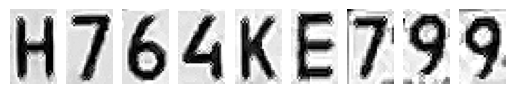

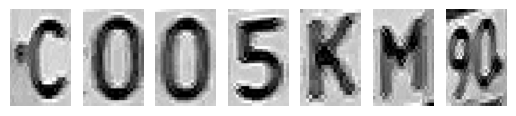

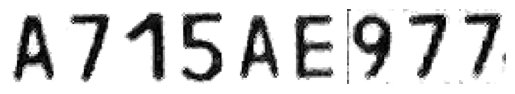

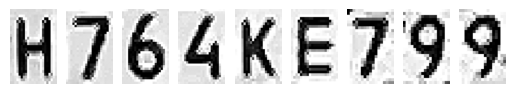

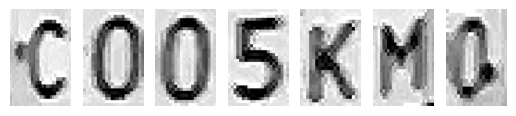

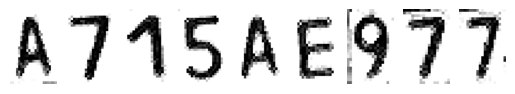

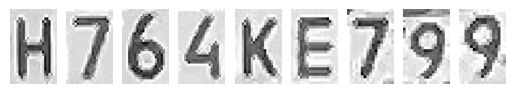

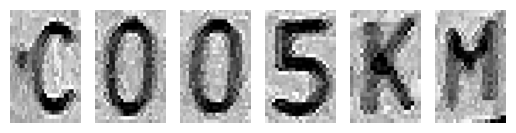

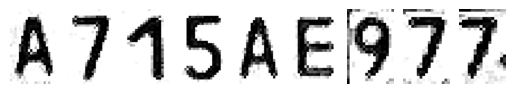

In [315]:
df_detected_plates_by_letter_easyocr = get_raw_text_subletter_easyocr(PICS_MAPS)

df_detected_plates_by_letter_easyocr

Объединим результаты в единый датасет

In [316]:
df_detected_plates_easyocr = pd.concat([
    df_detected_plates_by_letter_easyocr,
    df_detected_whole_plates_easyocr
])

df_detected_plates_easyocr

,psm,oem,result,target,img,model
0,-,-,H764KE799,H764KE799,clean_plate11,by_letters_easyocr
1,-,-,{005KH,C005KM190,clean_plate12,by_letters_easyocr
2,-,-,A4154E974,A715AE977,clean_plate13,by_letters_easyocr
3,-,-,H764KE799,H764KE799,clean_plate21,by_letters_easyocr
4,-,-,{005J,C005KM190,clean_plate22,by_letters_easyocr
5,-,-,A745E477,A715AE977,clean_plate23,by_letters_easyocr
6,-,-,H74KE790,H764KE799,clean_plate31,by_letters_easyocr
7,-,-,4005K,C005KM190,clean_plate32,by_letters_easyocr
8,-,-,A715A97,A715AE977,clean_plate33,by_letters_easyocr
0,-,-,H764KE799,H764KE799,clean_plate11,easyocr


## Pytesseract

In [ ]:
import pytesseract
import pandas as pd
import re

Попробуем определить целый номер с помощью tesseract

In [323]:
def get_raw_text_tesseract(pics_map):
    results = deepcopy(RESULTS_PATTERN)

    for el in pics_map:
        n, img, _, target = el.values()
        for psm in range(0, 14):
            for oem in range(0,4):
                try:
                    results['result'].append(pytesseract.image_to_string(
                        img,
                        config=f'--psm {psm} --oem {oem} -c tessedit_char_whitelist=0145679ACEHKM'
                    ))
                    results['psm'].append(psm)
                    results['oem'].append(oem)
                    results['img'].append(n)
                    results['target'].append(target)
                    results['model'].append('tesseract')
                except: ...

    return pd.DataFrame(results)

In [374]:
df_detected_whole_plates_tesseract = get_raw_text_tesseract(PICS_MAPS)

df_detected_whole_plates_tesseract

Python(31381) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(31382) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(31383) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(31384) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(31385) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(31386) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(31387) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(31388) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(31389) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(31390) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(31391) Malloc

,psm,oem,result,target,img,model
0,1,1,,H764KE799,clean_plate11,tesseract
1,1,3,,H764KE799,clean_plate11,tesseract
2,3,1,,H764KE799,clean_plate11,tesseract
3,3,3,,H764KE799,clean_plate11,tesseract
4,4,1,,H764KE799,clean_plate11,tesseract
...,...,...,...,...,...,...
211,11,3,A715AE977\n,A715AE977,clean_plate33,tesseract
212,12,1,A715AE977\n,A715AE977,clean_plate33,tesseract
213,12,3,A715AE977\n,A715AE977,clean_plate33,tesseract
214,13,1,A715AE977\n,A715AE977,clean_plate33,tesseract


Проделаем тоже самое побуквенно

In [ ]:
def get_raw_text_subletter_tesseract(pics_map, inc=4):
    results = deepcopy(RESULTS_PATTERN)

    for el in pics_map:
        name, pic, contours, target = el.values()

        for psm in range(0, 14):
            for oem in range(0,4):
                results['result'].append('')
                for i, box in enumerate(sorted(contours, key=lambda x: x[0])):
                    sign_pic = pic[box[1]-inc:box[3]+inc, box[0]-inc:box[2]+inc]
                    resized_pic = cv2.resize(sign_pic, (200, 320),
                                            interpolation=cv2.INTER_AREA)

                    try:
                        results['result'][-1] += \
                            ''.join(re.findall(
                                r'[A-Za-z0-9]',
                                pytesseract.image_to_string(
                                    resized_pic,
                                    config=f'--psm {psm} --oem {oem} -c tessedit_char_whitelist=0145679ACEHKM'
                                )    
                            ))       
                    except: ...
                results['psm'].append(psm)
                results['oem'].append(oem)
                results['img'].append(name)
                results['target'].append(target)
                results['model'].append('by_letters_tesseract')

    return pd.DataFrame(results)

In [ ]:
df_detected_plates_by_letter_tesseract = get_raw_text_subletter_tesseract(PICS_MAPS)


df_detected_plates_by_letter_tesseract

Python(20781) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(20784) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(20785) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(20788) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(20792) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(20793) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(20794) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(20796) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(20797) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(20798) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(20799) Malloc

,psm,oem,result,target,img,model
0,0,0,,H764KE799,clean_plate11,by_letters_tesseract
1,0,1,,H764KE799,clean_plate11,by_letters_tesseract
2,0,2,,H764KE799,clean_plate11,by_letters_tesseract
3,0,3,,H764KE799,clean_plate11,by_letters_tesseract
4,1,0,,H764KE799,clean_plate11,by_letters_tesseract
...,...,...,...,...,...,...
499,12,3,9,A715AE977,clean_plate33,by_letters_tesseract
500,13,0,,A715AE977,clean_plate33,by_letters_tesseract
501,13,1,A74AE97,A715AE977,clean_plate33,by_letters_tesseract
502,13,2,,A715AE977,clean_plate33,by_letters_tesseract


Объединим результаты в единый датасет

In [325]:
df_detected_plates_tesseract = pd.concat([
    df_detected_plates_by_letter_tesseract,
    df_detected_whole_plates_tesseract
])

df_detected_plates_tesseract

,psm,oem,result,target,img,model
0,0,0,,H764KE799,clean_plate11,by_letters_tesseract
1,0,1,,H764KE799,clean_plate11,by_letters_tesseract
2,0,2,,H764KE799,clean_plate11,by_letters_tesseract
3,0,3,,H764KE799,clean_plate11,by_letters_tesseract
4,1,0,,H764KE799,clean_plate11,by_letters_tesseract
...,...,...,...,...,...,...
211,11,3,A715AE977\n,A715AE977,clean_plate33,tesseract
212,12,1,A715AE977\n,A715AE977,clean_plate33,tesseract
213,12,3,A715AE977\n,A715AE977,clean_plate33,tesseract
214,13,1,A715AE977\n,A715AE977,clean_plate33,tesseract


# 8. Коррекция текста

Для оценки качества распознавания необходимо отчистить все результаты

In [326]:
df_detected_plates = pd.concat([
    df_detected_plates_easyocr,
    df_detected_plates_tesseract
])

print(f'{len(df_detected_plates_easyocr) + len(df_detected_plates_tesseract)} == {len(df_detected_plates)}')
df_detected_plates

738 == 738


,psm,oem,result,target,img,model
0,-,-,H764KE799,H764KE799,clean_plate11,by_letters_easyocr
1,-,-,{005KH,C005KM190,clean_plate12,by_letters_easyocr
2,-,-,A4154E974,A715AE977,clean_plate13,by_letters_easyocr
3,-,-,H764KE799,H764KE799,clean_plate21,by_letters_easyocr
4,-,-,{005J,C005KM190,clean_plate22,by_letters_easyocr
...,...,...,...,...,...,...
211,11,3,A715AE977\n,A715AE977,clean_plate33,tesseract
212,12,1,A715AE977\n,A715AE977,clean_plate33,tesseract
213,12,3,A715AE977\n,A715AE977,clean_plate33,tesseract
214,13,1,A715AE977\n,A715AE977,clean_plate33,tesseract


In [ ]:
# [Optional] Save dirty plates detections

# df_detected_plates.to_csv(SOURCES_DIR_PATH+'df_detected_plates_dirty.csv', index_label=False)

In [328]:
df_detected_plates['result'] = df_detected_plates['result'].apply(
    lambda x: ''.join(re.findall(r'[A-Za-z0-9]', x)).upper()
)

df_detected_plates

,psm,oem,result,target,img,model
0,-,-,H764KE799,H764KE799,clean_plate11,by_letters_easyocr
1,-,-,005KH,C005KM190,clean_plate12,by_letters_easyocr
2,-,-,A4154E974,A715AE977,clean_plate13,by_letters_easyocr
3,-,-,H764KE799,H764KE799,clean_plate21,by_letters_easyocr
4,-,-,005J,C005KM190,clean_plate22,by_letters_easyocr
...,...,...,...,...,...,...
211,11,3,A715AE977,A715AE977,clean_plate33,tesseract
212,12,1,A715AE977,A715AE977,clean_plate33,tesseract
213,12,3,A715AE977,A715AE977,clean_plate33,tesseract
214,13,1,A715AE977,A715AE977,clean_plate33,tesseract


# 9. Оценка качества распознавания

In [ ]:
import nltk

# Let's calculate levenshtein distance

df_detected_plates['CER_metric'] = df_detected_plates.apply(
    lambda row: (nltk.edit_distance(
        row['result'], row['target']
    ) / len(row['result'])) * 100 if len(row['result']) else len(row['target']) * 100,
    axis=1
)

In [366]:
def get_metrics_groupby_img(
    df, 
    group_display_count=5, 
    sorted_columnname=['CER_metric'],
    ascending=[True]
):
    return df.groupby('img', group_keys=False).apply(
            lambda x: x.sort_values(by=sorted_columnname, ascending=ascending)
        ).groupby('img').head(group_display_count).groupby('img').apply(
            lambda x: x.sort_values(sorted_columnname, ascending=ascending)
        ).drop(columns=['img'], axis=1, inplace=False)

In [342]:
# Get metrics for every model

get_metrics_groupby_img(
    df_detected_plates[df_detected_plates.model.isin(['easyocr', 'tesseract'])],
    # group_display_count=1
)

/var/folders/22/40809ksx1nn76c07qmtrv6sw0000gn/T/ipykernel_84780/3381851467.py:2: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return df.groupby('img', group_keys=False).apply(
/var/folders/22/40809ksx1nn76c07qmtrv6sw0000gn/T/ipykernel_84780/3381851467.py:4: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ).groupby('img').head(group_display_count).groupby('img').apply(


psm oem      result     target      model  CER_metric
img                                                                    
clean_plate11 0     -   -   H764KE799  H764KE799    easyocr    0.000000
              17   10   3   H764KE994  H764KE799  tesseract   22.222222
              16   10   1   H764KE994  H764KE799  tesseract   22.222222
              15    9   3   H764KE994  H764KE799  tesseract   22.222222
              14    9   1   H764KE994  H764KE799  tesseract   22.222222
clean_plate12 47   13   3      C005KM  C005KM190  tesseract   50.000000
              37    8   3      C005KM  C005KM190  tesseract   50.000000
              36    8   1      C005KM  C005KM190  tesseract   50.000000
              46   13   1      C005KM  C005KM190  tesseract   50.000000
              41   10   3       C05KM  C005KM190  tesseract   80.000000
clean_plate13 59    7   3  A715AE9779  A715AE977  tesseract   10.000000
              65   10   3  A715AE9779  A715AE977  tesseract   10.000000
              64   10   1  A715AE9779  A715AE977  tesseract   10.000000
              63    9   3  A715AE9779  A715AE977  tesseract   10.000000
              62    9   1  A715AE9779  A715AE977  tesseract   10.000000
clean_plate21 3     -   -  H764KE1V99  H764KE799    easyocr   20.000000
              91   11   3     H764KE7  H764KE799  tesseract   28.571429
              90   11   1     H764KE7  H764KE799  tesseract   28.571429
              89   10   3     764KE99  H764KE799  tesseract   28.571429
              88   10   1     764KE99  H764KE799  tesseract   28.571429
clean_plate22 117  12   3     C005KM0  C005KM190  tesseract   28.571429
              116  12   1     C005KM0  C005KM190  tesseract   28.571429
              107   7   3      C005KM  C005KM190  tesseract   50.000000
              115  11   3      C005KM  C005KM190  tesseract   50.000000
              114  11   1      C005KM  C005KM190  tesseract   50.000000
clean_plate23 131   7   3   A715AE977  A715AE977  tesseract    0.000000
              141  12   3   A715AE977  A715AE977  tesseract    0.000000
              140  12   1   A715AE977  A715AE977  tesseract    0.000000
              139  11   3   A715AE977  A715AE977  tesseract    0.000000
              138  11   1   A715AE977  A715AE977  tesseract    0.000000
clean_plate31 6     -   -   H764KE799  H764KE799    easyocr    0.000000
              161  10   3       764KE  H764KE799  tesseract   80.000000
              160  10   1       764KE  H764KE799  tesseract   80.000000
              159   9   3       764KE  H764KE799  tesseract   80.000000
              158   9   1       764KE  H764KE799  tesseract   80.000000
clean_plate32 189  12   3   C005KM490  C005KM190  tesseract   11.111111
              188  12   1   C005KM490  C005KM190  tesseract   11.111111
              187  11   3   C005KM490  C005KM190  tesseract   11.111111
              186  11   1   C005KM490  C005KM190  tesseract   11.111111
              185  10   3      C005KM  C005KM190  tesseract   50.000000
clean_plate33 215  13   3   A715AE977  A715AE977  tesseract    0.000000
              213  12   3   A715AE977  A715AE977  tesseract    0.000000
              212  12   1   A715AE977  A715AE977  tesseract    0.000000
              211  11   3   A715AE977  A715AE977  tesseract    0.000000
              210  11   1   A715AE977  A715AE977  tesseract    0.000000

In [343]:
# Get metrics for every model by letters

get_metrics_groupby_img(
    df_detected_plates[
        df_detected_plates.model.isin(['by_letters_easyocr', 'by_letters_tesseract'])
    ],
    # group_display_count=1
)

/var/folders/22/40809ksx1nn76c07qmtrv6sw0000gn/T/ipykernel_84780/3381851467.py:2: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return df.groupby('img', group_keys=False).apply(
/var/folders/22/40809ksx1nn76c07qmtrv6sw0000gn/T/ipykernel_84780/3381851467.py:4: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ).groupby('img').head(group_display_count).groupby('img').apply(


psm oem     result     target                 model  \
img                                                                     
clean_plate11 0     -   -  H764KE799  H764KE799    by_letters_easyocr   
              53   13   1  H764KE799  H764KE799  by_letters_tesseract   
              35    8   3  H764KE799  H764KE799  by_letters_tesseract   
              33    8   1  H764KE799  H764KE799  by_letters_tesseract   
              55   13   3  H764KE799  H764KE799  by_letters_tesseract   
clean_plate12 111  13   3   C005KM90  C005KM190  by_letters_tesseract   
              109  13   1   C005KM90  C005KM190  by_letters_tesseract   
              99   10   3   C005KM90  C005KM190  by_letters_tesseract   
              97   10   1   C005KM90  C005KM190  by_letters_tesseract   
              95    9   3   C005KM90  C005KM190  by_letters_tesseract   
clean_plate13 167  13   3  A745AE977  A715AE977  by_letters_tesseract   
              165  13   1  A745AE977  A715AE977  by_letters_tesseract   
              147   8   3  A745AE977  A715AE977  by_letters_tesseract   
              145   8   1  A745AE977  A715AE977  by_letters_tesseract   
              137   6   1   A745AE97  A715AE977  by_letters_tesseract   
clean_plate21 3     -   -  H764KE799  H764KE799    by_letters_easyocr   
              221  13   1  H764KE799  H764KE799  by_letters_tesseract   
              203   8   3  H764KE799  H764KE799  by_letters_tesseract   
              201   8   1  H764KE799  H764KE799  by_letters_tesseract   
              223  13   3  H764KE799  H764KE799  by_letters_tesseract   
clean_plate22 279  13   3     C00KM0  C005KM190  by_letters_tesseract   
              277  13   1     C00KM0  C005KM190  by_letters_tesseract   
              259   8   3     C00KM0  C005KM190  by_letters_tesseract   
              257   8   1     C00KM0  C005KM190  by_letters_tesseract   
              267  10   3     00KKM0  C005KM190  by_letters_tesseract   
clean_plate23 335  13   3  A745AE977  A715AE977  by_letters_tesseract   
              333  13   1  A745AE977  A715AE977  by_letters_tesseract   
              323  10   3  A745AE977  A715AE977  by_letters_tesseract   
              321  10   1  A745AE977  A715AE977  by_letters_tesseract   
              319   9   3  A745AE977  A715AE977  by_letters_tesseract   
clean_plate31 391  13   3  H764KE799  H764KE799  by_letters_tesseract   
              389  13   1  H764KE799  H764KE799  by_letters_tesseract   
              379  10   3  H764KE799  H764KE799  by_letters_tesseract   
              377  10   1  H764KE799  H764KE799  by_letters_tesseract   
              375   9   3  H764KE799  H764KE799  by_letters_tesseract   
clean_plate32 447  13   3     C005KM  C005KM190  by_letters_tesseract   
              445  13   1     C005KM  C005KM190  by_letters_tesseract   
              427   8   3     C005KM  C005KM190  by_letters_tesseract   
              425   8   1     C005KM  C005KM190  by_letters_tesseract   
              435  10   3     C005K4  C005KM190  by_letters_tesseract   
clean_plate33 491  10   3   A745AE97  A715AE977  by_letters_tesseract   
              489  10   1   A745AE97  A715AE977  by_letters_tesseract   
              487   9   3   A745AE97  A715AE977  by_letters_tesseract   
              485   9   1   A745AE97  A715AE977  by_letters_tesseract   
              8     -   -    A715A97  A715AE977    by_letters_easyocr   

                   CER_metric  
img                            
clean_plate11 0      0.000000  
              53     0.000000  
              35     0.000000  
              33     0.000000  
              55     0.000000  
clean_plate12 111   12.500000  
              109   12.500000  
              99    12.500000  
              97    12.500000  
              95    12.500000  
clean_plate13 167   11.111111  
              165   11.111111  
              147   11.111111  
              145   11.111111  
              137   25.000000  
clean_plate21 3      0.000000  
          

In [346]:
# Best results

get_metrics_groupby_img(
    df_detected_plates,
    group_display_count=1
)

/var/folders/22/40809ksx1nn76c07qmtrv6sw0000gn/T/ipykernel_84780/3381851467.py:2: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return df.groupby('img', group_keys=False).apply(
/var/folders/22/40809ksx1nn76c07qmtrv6sw0000gn/T/ipykernel_84780/3381851467.py:4: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ).groupby('img').head(group_display_count).groupby('img').apply(


,,psm,oem,result,target,model,CER_metric
img,,,,,,,
clean_plate11,0,-,-,H764KE799,H764KE799,by_letters_easyocr,0.000000
clean_plate12,89,8,1,C005KM90,C005KM190,by_letters_tesseract,12.500000
clean_plate13,58,7,1,A715AE9779,A715AE977,tesseract,10.000000
clean_plate21,3,-,-,H764KE799,H764KE799,by_letters_easyocr,0.000000
clean_plate22,117,12,3,C005KM0,C005KM190,tesseract,28.571429
clean_plate23,143,13,3,A715AE977,A715AE977,tesseract,0.000000
clean_plate31,369,8,1,H764KE799,H764KE799,by_letters_tesseract,0.000000
clean_plate32,189,12,3,C005KM490,C005KM190,tesseract,11.111111
clean_plate33,215,13,3,A715AE977,A715AE977,tesseract,0.000000


In [ ]:
# Try to define optimal parameters for all tesseracts

get_metrics_groupby_img(
    df_detected_plates[
        df_detected_plates.psm.isin([13, 12, 10]) & df_detected_plates.oem.isin([1])
    ],
    group_display_count=3,
    sorted_columnname=['CER_metric', 'psm'],
    ascending=[True, False]
)

/var/folders/22/40809ksx1nn76c07qmtrv6sw0000gn/T/ipykernel_84780/2933684840.py:7: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return df.groupby('img', group_keys=False).apply(
/var/folders/22/40809ksx1nn76c07qmtrv6sw0000gn/T/ipykernel_84780/2933684840.py:9: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ).groupby('img').head(group_display_count).groupby('img').apply(


psm oem      result     target                 model  \
img                                                                      
clean_plate11 53   13   1   H764KE799  H764KE799  by_letters_tesseract   
              41   10   1    H764K799  H764KE799  by_letters_tesseract   
              22   13   1   H764KE994  H764KE799             tesseract   
clean_plate12 109  13   1    C005KM90  C005KM190  by_letters_tesseract   
              97   10   1    C005KM90  C005KM190  by_letters_tesseract   
              46   13   1      C005KM  C005KM190             tesseract   
clean_plate13 64   10   1  A715AE9779  A715AE977             tesseract   
              165  13   1   A745AE977  A715AE977  by_letters_tesseract   
              68   12   1    A715AE97  A715AE977             tesseract   
clean_plate21 221  13   1   H764KE799  H764KE799  by_letters_tesseract   
              209  10   1   H764KE791  H764KE799  by_letters_tesseract   
              94   13   1     764KE99  H764KE799             tesseract   
clean_plate22 116  12   1     C005KM0  C005KM190             tesseract   
              277  13   1      C00KM0  C005KM190  by_letters_tesseract   
              112  10   1      C005KM  C005KM190             tesseract   
clean_plate23 142  13   1   A715AE977  A715AE977             tesseract   
              140  12   1   A715AE977  A715AE977             tesseract   
              136  10   1   A715AE977  A715AE977             tesseract   
clean_plate31 389  13   1   H764KE799  H764KE799  by_letters_tesseract   
              377  10   1   H764KE799  H764KE799  by_letters_tesseract   
              385  12   1      74K799  H764KE799  by_letters_tesseract   
clean_plate32 188  12   1   C005KM490  C005KM190             tesseract   
              445  13   1      C005KM  C005KM190  by_letters_tesseract   
              184  10   1      C005KM  C005KM190             tesseract   
clean_plate33 214  13   1   A715AE977  A715AE977             tesseract   
              212  12   1   A715AE977  A715AE977             tesseract   
              208  10   1   A715AE977  A715AE977             tesseract   

                   CER_metric  
img                            
clean_plate11 53     0.000000  
              41    12.500000  
              22    22.222222  
clean_plate12 109   12.500000  
              97    12.500000  
              46    50.000000  
clean_plate13 64    10.000000  
              165   11.111111  
              68    12.500000  
clean_plate21 221    0.000000  
              209   11.111111  
              94    28.571429  
clean_plate22 116   28.571429  
              277   50.000000  
              112   50.000000  
clean_plate23 142    0.000000  
              140    0.000000  
              136    0.000000  
clean_plate31 389    0.000000  
              377    0.000000  
              385   50.000000  
clean_plate32 188   11.111111  
              445   50.000000  
              184   50.000000  
clean_plate33 214    0.000000  
              212    0.000000  
              208    0.000000

In [ ]:
# Try to define optimal parameters for tesseract

get_metrics_groupby_img(
    df_detected_plates[
        df_detected_plates.model == 'tesseract'
        # df_detected_plates.psm.isin([13, 12, 10]) & df_detected_plates.oem.isin([1])
    ],
    group_display_count=5,
    sorted_columnname=['CER_metric', 'psm'],
    ascending=[True, False]
)

/var/folders/22/40809ksx1nn76c07qmtrv6sw0000gn/T/ipykernel_84780/2933684840.py:7: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return df.groupby('img', group_keys=False).apply(
/var/folders/22/40809ksx1nn76c07qmtrv6sw0000gn/T/ipykernel_84780/2933684840.py:9: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ).groupby('img').head(group_display_count).groupby('img').apply(


psm oem      result     target      model  CER_metric
img                                                                    
clean_plate11 22   13   1   H764KE994  H764KE799  tesseract   22.222222
              23   13   3   H764KE994  H764KE799  tesseract   22.222222
              16   10   1   H764KE994  H764KE799  tesseract   22.222222
              17   10   3   H764KE994  H764KE799  tesseract   22.222222
              14    9   1   H764KE994  H764KE799  tesseract   22.222222
clean_plate12 46   13   1      C005KM  C005KM190  tesseract   50.000000
              47   13   3      C005KM  C005KM190  tesseract   50.000000
              36    8   1      C005KM  C005KM190  tesseract   50.000000
              37    8   3      C005KM  C005KM190  tesseract   50.000000
              40   10   1       C05KM  C005KM190  tesseract   80.000000
clean_plate13 64   10   1  A715AE9779  A715AE977  tesseract   10.000000
              65   10   3  A715AE9779  A715AE977  tesseract   10.000000
              62    9   1  A715AE9779  A715AE977  tesseract   10.000000
              63    9   3  A715AE9779  A715AE977  tesseract   10.000000
              58    7   1  A715AE9779  A715AE977  tesseract   10.000000
clean_plate21 94   13   1     764KE99  H764KE799  tesseract   28.571429
              95   13   3     764KE99  H764KE799  tesseract   28.571429
              90   11   1     H764KE7  H764KE799  tesseract   28.571429
              91   11   3     H764KE7  H764KE799  tesseract   28.571429
              88   10   1     764KE99  H764KE799  tesseract   28.571429
clean_plate22 116  12   1     C005KM0  C005KM190  tesseract   28.571429
              117  12   3     C005KM0  C005KM190  tesseract   28.571429
              114  11   1      C005KM  C005KM190  tesseract   50.000000
              115  11   3      C005KM  C005KM190  tesseract   50.000000
              112  10   1      C005KM  C005KM190  tesseract   50.000000
clean_plate23 142  13   1   A715AE977  A715AE977  tesseract    0.000000
              143  13   3   A715AE977  A715AE977  tesseract    0.000000
              140  12   1   A715AE977  A715AE977  tesseract    0.000000
              141  12   3   A715AE977  A715AE977  tesseract    0.000000
              138  11   1   A715AE977  A715AE977  tesseract    0.000000
clean_plate31 166  13   1       764KE  H764KE799  tesseract   80.000000
              167  13   3       764KE  H764KE799  tesseract   80.000000
              160  10   1       764KE  H764KE799  tesseract   80.000000
              161  10   3       764KE  H764KE799  tesseract   80.000000
              158   9   1       764KE  H764KE799  tesseract   80.000000
clean_plate32 188  12   1   C005KM490  C005KM190  tesseract   11.111111
              189  12   3   C005KM490  C005KM190  tesseract   11.111111
              186  11   1   C005KM490  C005KM190  tesseract   11.111111
              187  11   3   C005KM490  C005KM190  tesseract   11.111111
              184  10   1      C005KM  C005KM190  tesseract   50.000000
clean_plate33 214  13   1   A715AE977  A715AE977  tesseract    0.000000
              215  13   3   A715AE977  A715AE977  tesseract    0.000000
              212  12   1   A715AE977  A715AE977  tesseract    0.000000
              213  12   3   A715AE977  A715AE977  tesseract    0.000000
              210  11   1   A715AE977  A715AE977  tesseract    0.000000

In [ ]:
# Try to define optimal parameters for tesseract by letters


get_metrics_groupby_img(
    df_detected_plates[
        df_detected_plates.model == 'by_letters_tesseract'
        # df_detected_plates.psm.isin([13, 12, 10]) & df_detected_plates.oem.isin([1])
    ],
    group_display_count=5,
    sorted_columnname=['CER_metric', 'psm'],
    ascending=[True, False]
)

/var/folders/22/40809ksx1nn76c07qmtrv6sw0000gn/T/ipykernel_84780/2933684840.py:7: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return df.groupby('img', group_keys=False).apply(
/var/folders/22/40809ksx1nn76c07qmtrv6sw0000gn/T/ipykernel_84780/2933684840.py:9: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ).groupby('img').head(group_display_count).groupby('img').apply(


psm oem     result     target                 model  \
img                                                                     
clean_plate11 53   13   1  H764KE799  H764KE799  by_letters_tesseract   
              55   13   3  H764KE799  H764KE799  by_letters_tesseract   
              33    8   1  H764KE799  H764KE799  by_letters_tesseract   
              35    8   3  H764KE799  H764KE799  by_letters_tesseract   
              41   10   1   H764K799  H764KE799  by_letters_tesseract   
clean_plate12 109  13   1   C005KM90  C005KM190  by_letters_tesseract   
              111  13   3   C005KM90  C005KM190  by_letters_tesseract   
              97   10   1   C005KM90  C005KM190  by_letters_tesseract   
              99   10   3   C005KM90  C005KM190  by_letters_tesseract   
              93    9   1   C005KM90  C005KM190  by_letters_tesseract   
clean_plate13 165  13   1  A745AE977  A715AE977  by_letters_tesseract   
              167  13   3  A745AE977  A715AE977  by_letters_tesseract   
              145   8   1  A745AE977  A715AE977  by_letters_tesseract   
              147   8   3  A745AE977  A715AE977  by_letters_tesseract   
              137   6   1   A745AE97  A715AE977  by_letters_tesseract   
clean_plate21 221  13   1  H764KE799  H764KE799  by_letters_tesseract   
              223  13   3  H764KE799  H764KE799  by_letters_tesseract   
              201   8   1  H764KE799  H764KE799  by_letters_tesseract   
              203   8   3  H764KE799  H764KE799  by_letters_tesseract   
              209  10   1  H764KE791  H764KE799  by_letters_tesseract   
clean_plate22 277  13   1     C00KM0  C005KM190  by_letters_tesseract   
              279  13   3     C00KM0  C005KM190  by_letters_tesseract   
              257   8   1     C00KM0  C005KM190  by_letters_tesseract   
              259   8   3     C00KM0  C005KM190  by_letters_tesseract   
              265  10   1     00KKM0  C005KM190  by_letters_tesseract   
clean_plate23 333  13   1  A745AE977  A715AE977  by_letters_tesseract   
              335  13   3  A745AE977  A715AE977  by_letters_tesseract   
              321  10   1  A745AE977  A715AE977  by_letters_tesseract   
              323  10   3  A745AE977  A715AE977  by_letters_tesseract   
              317   9   1  A745AE977  A715AE977  by_letters_tesseract   
clean_plate31 389  13   1  H764KE799  H764KE799  by_letters_tesseract   
              391  13   3  H764KE799  H764KE799  by_letters_tesseract   
              377  10   1  H764KE799  H764KE799  by_letters_tesseract   
              379  10   3  H764KE799  H764KE799  by_letters_tesseract   
              373   9   1  H764KE799  H764KE799  by_letters_tesseract   
clean_plate32 445  13   1     C005KM  C005KM190  by_letters_tesseract   
              447  13   3     C005KM  C005KM190  by_letters_tesseract   
              425   8   1     C005KM  C005KM190  by_letters_tesseract   
              427   8   3     C005KM  C005KM190  by_letters_tesseract   
              433  10   1     C005K4  C005KM190  by_letters_tesseract   
clean_plate33 489  10   1   A745AE97  A715AE977  by_letters_tesseract   
              491  10   3   A745AE97  A715AE977  by_letters_tesseract   
              485   9   1   A745AE97  A715AE977  by_letters_tesseract   
              487   9   3   A745AE97  A715AE977  by_letters_tesseract   
              501  13   1    A74AE97  A715AE977  by_letters_tesseract   

                   CER_metric  
img                            
clean_plate11 53     0.000000  
              55     0.000000  
              33     0.000000  
              35     0.000000  
              41    12.500000  
clean_plate12 109   12.500000  
              111   12.500000  
              97    12.500000  
              99    12.500000  
              93    12.500000  
clean_plate13 165   11.111111  
              167   11.111111  
              145   11.111111  
              147   11.111111  
              137   25.000000  
clean_plate21 221    0.000000  
          

Tesseract с подобранными параметрами `psm in [10, 12, 13] & oem 1` в среднем справляетя лучше, чем easyocr. При этом побуквенное распознование работает более точно и стабильно, однако минус подхода в том, что не все буквы удается выделить достаточно корректно.

Таким образом, объединив подходы, можно добиться приемлемого качества. В случае одинакового скора отдавать предпочтение стоит распознаванию всего номера сразу, поскольку это менее затратная операция.

Мы же остановимся на вводных:
```json
model: by_letters_tesseract
psm: 13
oem: 1
```

In [407]:
df_final_results = get_metrics_groupby_img(
    df_detected_plates[
        (df_detected_plates.model == 'by_letters_tesseract')
        & (df_detected_plates.psm == 13) 
        & (df_detected_plates.oem == 1)
    ],
    # group_display_count=5,
    sorted_columnname=['CER_metric', 'psm'],
    ascending=[True, False]
).head(3)

df_final_results

/var/folders/22/40809ksx1nn76c07qmtrv6sw0000gn/T/ipykernel_84780/2933684840.py:7: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return df.groupby('img', group_keys=False).apply(
/var/folders/22/40809ksx1nn76c07qmtrv6sw0000gn/T/ipykernel_84780/2933684840.py:9: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ).groupby('img').head(group_display_count).groupby('img').apply(


,,psm,oem,result,target,model,CER_metric
img,,,,,,,
clean_plate11,53,13,1,H764KE799,H764KE799,by_letters_tesseract,0.000000
clean_plate12,109,13,1,C005KM90,C005KM190,by_letters_tesseract,12.500000
clean_plate13,165,13,1,A745AE977,A715AE977,by_letters_tesseract,11.111111


Выведем итоговые распознанные номера для первой версии изображени в требуемом формате

In [408]:
def get_number(raw_text):
    plate_number = raw_text[:6]

    plate_region = raw_text[6:]
    plate_region = plate_region[:3]

    return plate_number + ' ' + plate_region

H764KE 799


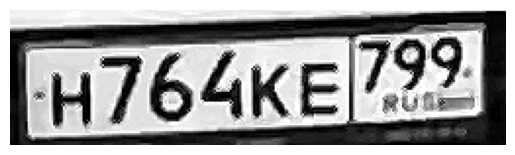

In [412]:
print(get_number(df_final_results.iloc[0].result))
show_pic(clean_plate11, cmap='gray')

C005KM 90


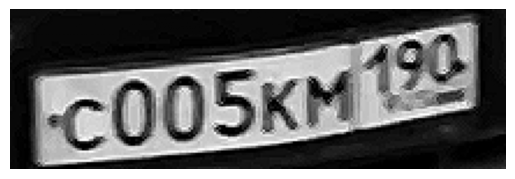

In [413]:
print(get_number(df_final_results.iloc[1].result))
show_pic(clean_plate12, cmap='gray')

A745AE 977


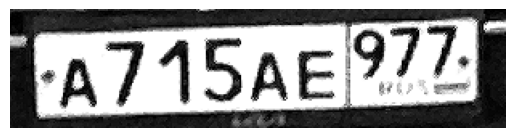

In [414]:
print(get_number(df_final_results.iloc[2].result))
show_pic(clean_plate13, cmap='gray')

# 10. [Доп задача] Распознавание видеокадров

В качестве эксперимента попробуем применить пайплайн предобработки, распознавания и замера качества для кадров с видео

In [421]:
frame1, frame2, frame3, frame4, frame5, frame6 = print_frames

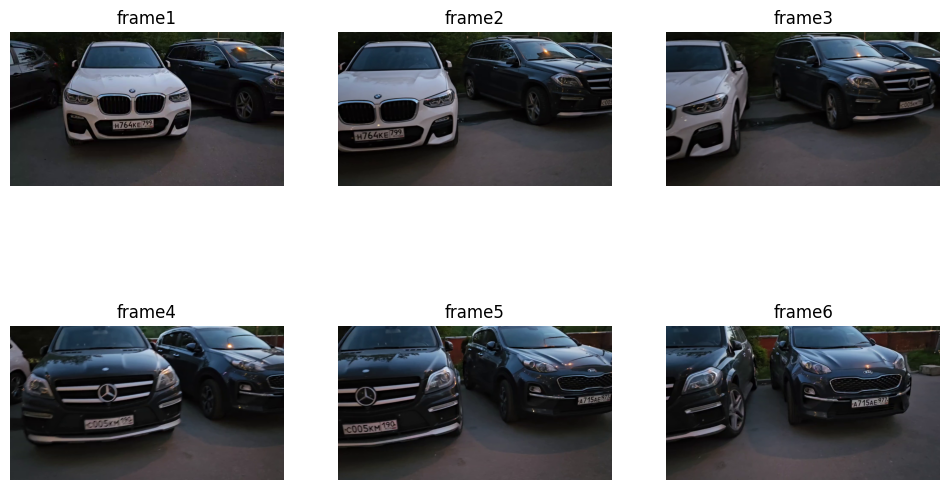

In [ ]:
fg, ax = plt.subplots(2, 3, figsize=(12, 7))

show_pic(frame1, ax=ax[0][0], title='frame1')
show_pic(frame2, ax=ax[0][1], title='frame2')
show_pic(frame3, ax=ax[0][2], title='frame3')
show_pic(frame4, ax=ax[1][0], title='frame4')
show_pic(frame5, ax=ax[1][1], title='frame5')
show_pic(frame6, ax=ax[1][2], title='frame6')

In [461]:
def get_raw_text_subletter_tesseract_frame(frame, letter_contours, inc=5):
    results = ''
    for box in sorted(letter_contours, key=lambda x: x[0]):
        sign_pic = frame[box[1]-inc:box[3]+inc, box[0]-inc:box[2]+inc]
        resized_pic = cv2.resize(sign_pic, (200, 320),
                                interpolation=cv2.INTER_AREA)

        try:
            results += \
                ''.join(re.findall(
                    r'[A-Za-z0-9]',
                    pytesseract.image_to_string(
                        resized_pic,
                        config=f'--psm {13} --oem {1} -c tessedit_char_whitelist=0145679ACEHKM'
                    )    
                ))       
        except: ...

    return results


def get_raw_text_tesseract_frame(frame):
    return ''.join(re.findall(
                r'[A-Za-z0-9]',
                pytesseract.image_to_string(
                    frame,
                    config=f'--psm {13} --oem {1} -c tessedit_char_whitelist=0145679ACEHKM'
                )    
            ))

In [467]:
def detect_frame_plate(frame, target_plate):
    try:
        clear_frame, letter_contours = get_clean_plate(
            get_plate(
                preprocess(frame),
                frame
            )
        )

        raw_plate = get_raw_text_subletter_tesseract_frame(
            clear_frame, letter_contours
        )
        # raw_plate = get_raw_text_tesseract_frame(
        #     clear_frame
        # )

        frame_plate = get_number(raw_plate)

        CER_metric = nltk.edit_distance(frame_plate, target_plate) / len(frame_plate) * 100
    except:
        raw_plate = ''
        frame_plate = ''
        if len(target_plate):
            CER_metric = 0
        else:
            CER_metric = len(target_plate) * 100

    print(
        f'Target plate: {target_plate}\nRaw detected plate text: {raw_plate}\nFrame detected plate text: {frame_plate}\nCER metric: {CER_metric}')
    
    return frame_plate

Попробуем распознать номер на каждом кадре

Threshold OTSU: 23.0
Finded rects coords: [[472, 400, 682, 459]]
Len of finded contures: 41


Python(37207) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(37208) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(37210) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(37211) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(37212) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(37213) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(37214) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(37215) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Target plate: H764KE 799
Raw detected plate text: H7644KE7
Frame detected plate text: H7644K E7
CER metric: 0.5555555555555556


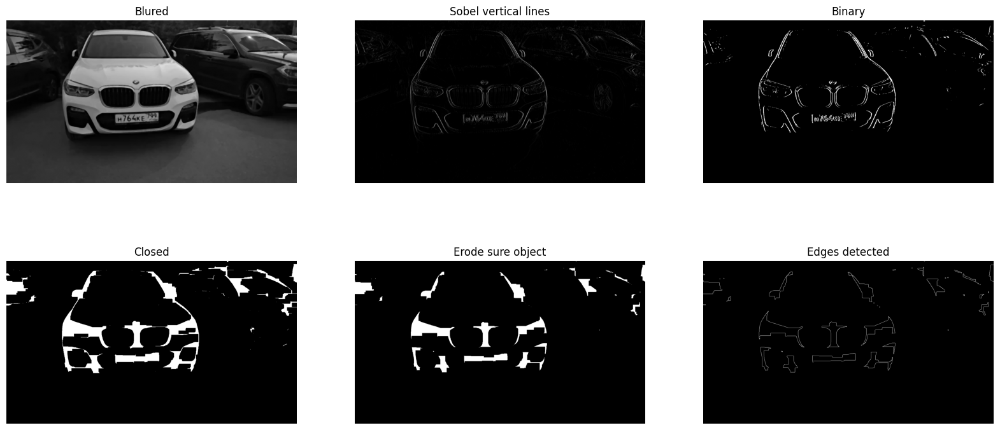

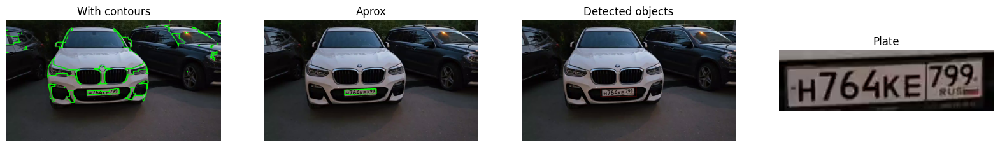

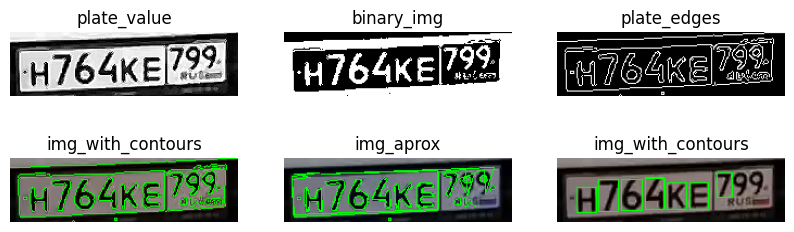

In [460]:
frame_plate1 = detect_frame_plate(frame1, target_plate='H764KE 799')

Threshold OTSU: 19.0
Finded rects coords: [[65, 442, 321, 516]]
Len of finded contures: 55


Python(37355) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(37356) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(37357) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(37358) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(37359) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(37360) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(37361) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(37362) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(37363) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Target plate: H764KE 799
Raw detected plate text: H764KE799
Frame detected plate text: H764KE 799
CER metric: 0.0


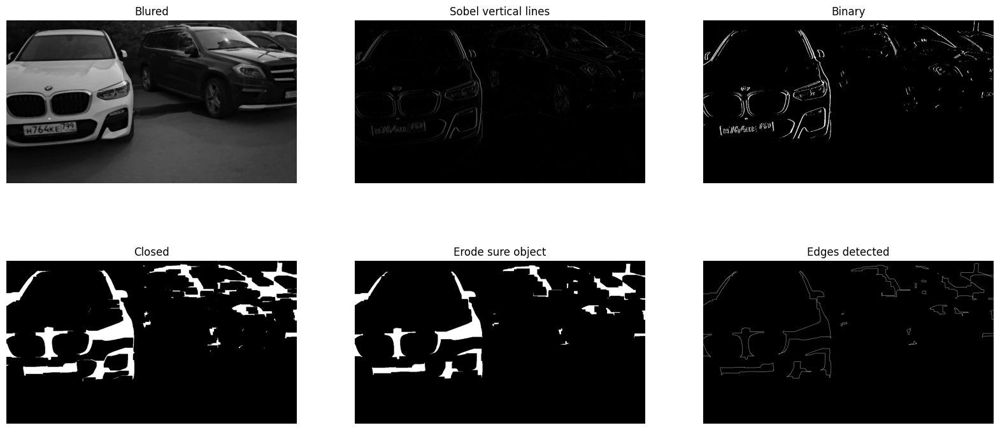

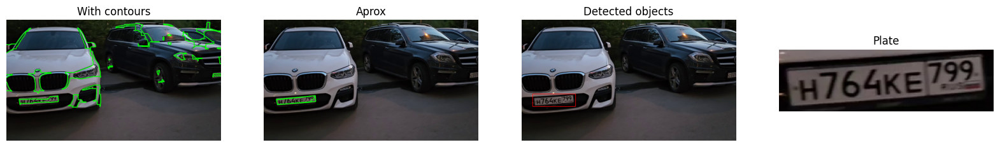

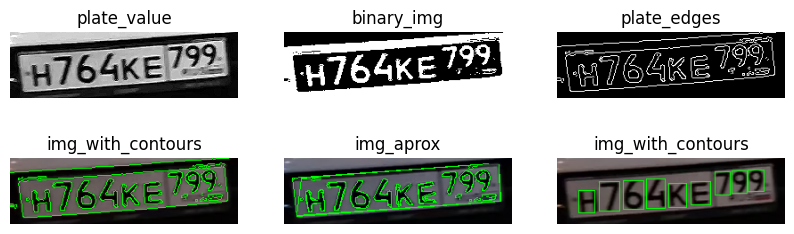

In [463]:
frame_plate2 = detect_frame_plate(frame2, target_plate='H764KE 799')

Threshold OTSU: 11.0
Finded rects coords: []
Target plate: 
Raw detected plate text: 
Frame detected plate text: 
CER metric: 0


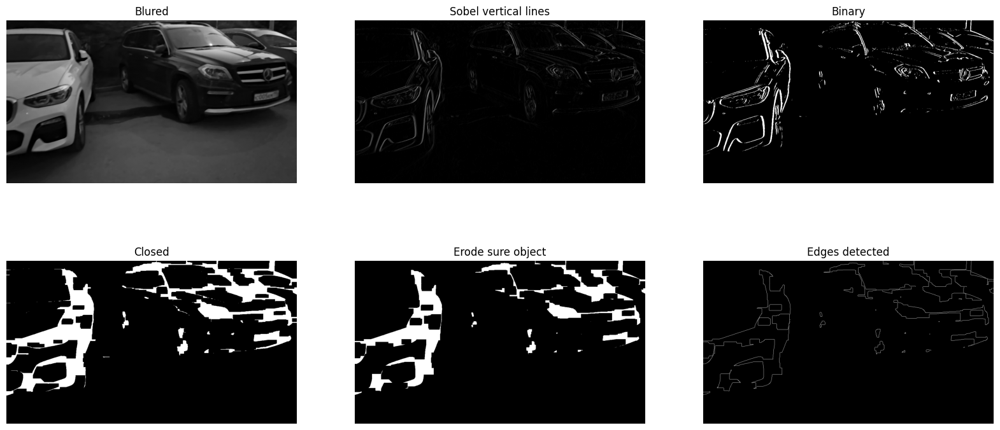

In [468]:
frame_plate3 = detect_frame_plate(frame3, target_plate='')

Threshold OTSU: 11.0
Finded rects coords: [[339, 410, 589, 488], [492, 262, 692, 339]]
Len of finded contures: 40


Python(37634) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Target plate: C005KM 190
Raw detected plate text: 
Frame detected plate text:  
CER metric: 900.0


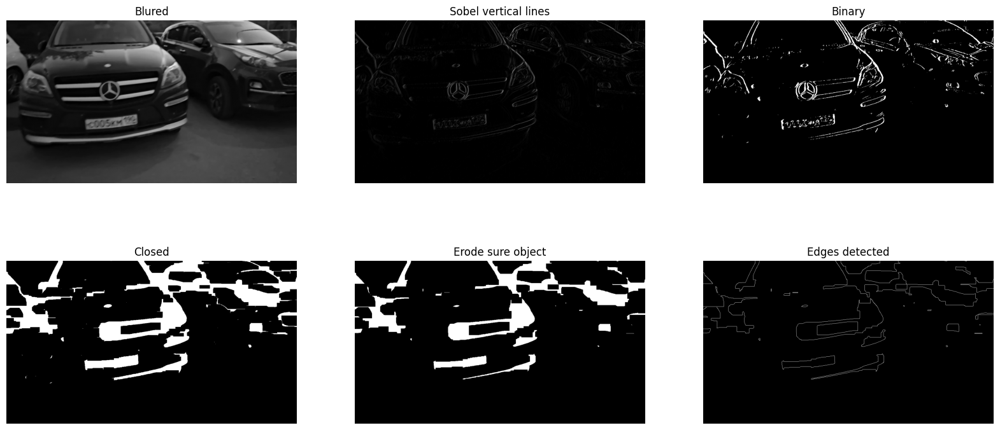

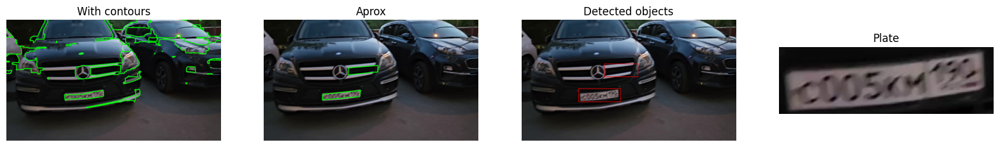

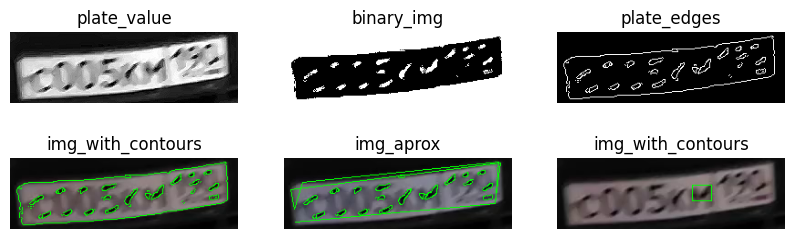

In [470]:
frame_plate4 = detect_frame_plate(frame4, target_plate='C005KM 190')

Threshold OTSU: 13.0
Finded rects coords: [[13, 431, 291, 513], [71, 278, 373, 381], [22, 115, 267, 187]]
Len of finded contures: 48


Python(37658) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(37659) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(37660) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(37661) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(37662) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(37664) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(37665) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(37666) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(37667) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Target plate: C005KM 190
Raw detected plate text: C005KM40
Frame detected plate text: C005KM 40
CER metric: 22.22222222222222


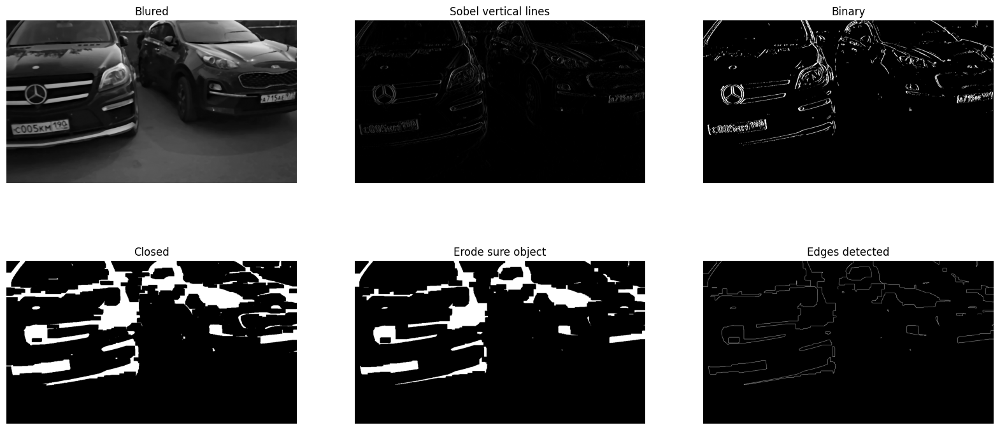

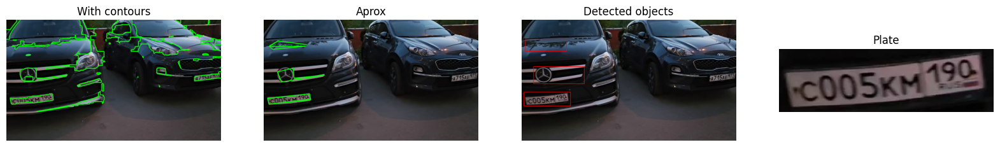

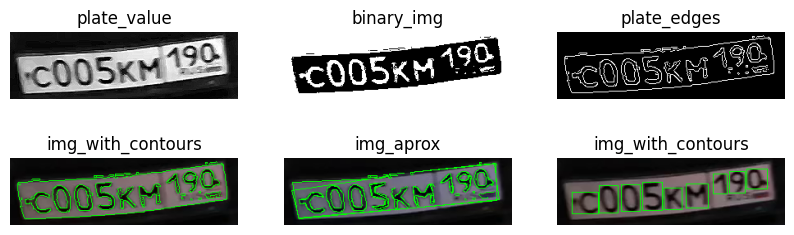

In [471]:
frame_plate5 = detect_frame_plate(frame5, target_plate='C005KM 190')

Threshold OTSU: 16.0
Finded rects coords: [[81, 346, 271, 412], [858, 316, 1056, 386]]
Len of finded contures: 18
Target plate: A715AE 977
Raw detected plate text: 
Frame detected plate text:  
CER metric: 900.0


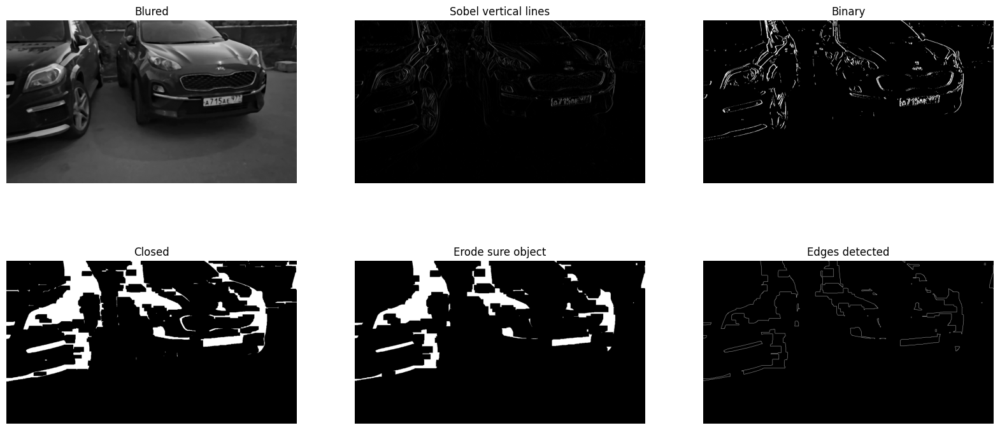

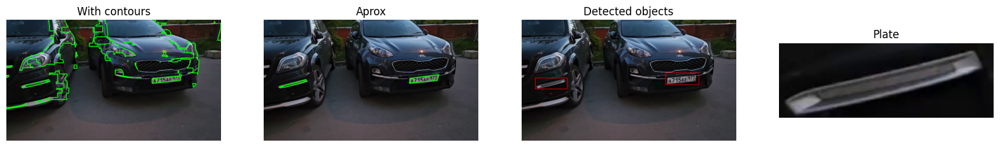

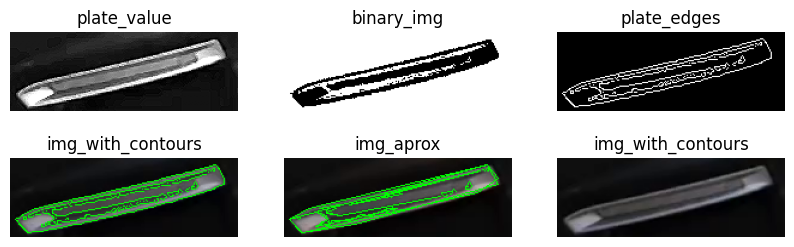

In [473]:
frame_plate6 = detect_frame_plate(frame6, target_plate='A715AE 977')

# 11. Выводы

Для распознавания текста на автомобильных номерах были применены методы предобработки изображений с последующим детектированием границ как номера, так и отдельных букв. В результате удалось применить два подхода к считыванию текста - побуквенно и считывание целого номера. И тот, и то вариант был реализован на основе моделей ocr и tesseract. В итоге было выбрано единое универсальное решение и посчитана метрика качества.

Так же в качестве доп задания итоговый пайплайн был применен ко фреймам видео.